# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

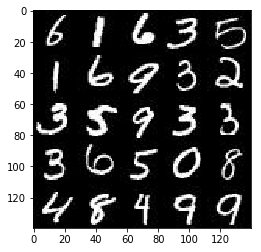

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

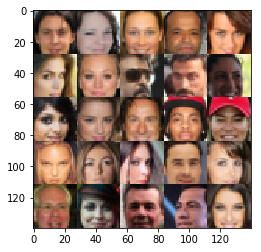

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="input_real")
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/local/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/local/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'F

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # input 28 * 28 * 3
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding= 'same')
        relu1 = tf.maximum(.01 * x1, x1)
        
        ## 14 * 14 * 64
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(bn2 * .1, bn2)
    
        ## 7 * 7 * 128
        x3 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='valid')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(bn3, bn3 * .1)
        
        ## 4 * 4 * 256
        flat = tf.reshape(relu3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1, activation= None)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_training=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_training):
        
        x1 = tf.layers.dense(z, 4*4*1024)
        ## reshape
        
        x1 = tf.reshape(x1, (-1, 4, 4, 1024))
        x1 = tf.layers.batch_normalization(x1, training = is_training)
        x1 = tf.maximum(.1 * x1, x1)
        ## 4x4x512
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_training)
        x2 = tf.maximum(.1 * x2, x2)
        ## 8 * 8 * 256
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_training)
        x3 = tf.maximum(.1 * x3, x3)
        ## 16* 16 * 128
        
        x4 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x3, training=is_training)
        x4 = tf.maximum(.1 * x3, x3)
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding = 'same')
        ## reshaped = tf.reshape(logits, (-1, 28, 28, out_channel_dim))
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real) * .9))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                        labels=tf.zeros_like(d_model_fake)))
                                 
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                   labels=tf.ones_like(d_logits_fake)))
                                 
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate).minimize(d_loss, var_list = d_vars)
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='generator')): ##req. for batch normalization
        g_train_opt = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model    
    steps = 0
    show_every = 100
    channels = 1
    
    if data_image_mode == 'RGB':
        channels = 3           
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)  
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps +=1
                            
                batch_images = batch_images * 2
                            
                # TODO: Train Model
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate })
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate })
                
                _ = sess.run(g_train_opt, feed_dict= {input_z: batch_z, lr: learning_rate })
                
                if steps % show_every == 0: 
                    show_generator_output(sess, 25, input_z, channels, data_image_mode)
                    
                if steps % 10 == 0:
                    train_loss_d = sess.run(d_loss, { input_z: batch_z, input_real: batch_images, lr: learning_rate  })
                    train_loss_g = g_loss.eval({input_z: batch_z, lr: learning_rate })
                    saver.save(sess, './checkpoints/generator.ckpt')

                    
                    print("\n Epoch {}/{} Step {}".format(epoch_i + 1, epochs, steps),
                          "Discriminator Loss: {:.4f} ... ".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
            train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images, lr: learning_rate })
            train_loss_g = g_loss.eval({input_z: batch_z, lr: learning_rate })

            print("\n Epoch {}/{}...".format(epoch_i+1, epochs),
                  "Discriminator Loss: {:.4f}...".format(train_loss_d),
                  "Generator Loss: {:.4f}".format(train_loss_g))
                    #show_generator_output(sess, 10, input_z, out_channel_dim, image_mode)

                    
                
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.


 Epoch 1/2 Step 10 Discriminator Loss: 4.0345 ...  Generator Loss: 0.0377

 Epoch 1/2 Step 20 Discriminator Loss: 3.5999 ...  Generator Loss: 0.0608

 Epoch 1/2 Step 30 Discriminator Loss: 3.7866 ...  Generator Loss: 0.0554

 Epoch 1/2 Step 40 Discriminator Loss: 3.5390 ...  Generator Loss: 0.0631

 Epoch 1/2 Step 50 Discriminator Loss: 3.3307 ...  Generator Loss: 0.0858

 Epoch 1/2 Step 60 Discriminator Loss: 3.1146 ...  Generator Loss: 0.1023

 Epoch 1/2 Step 70 Discriminator Loss: 2.8241 ...  Generator Loss: 0.1473

 Epoch 1/2 Step 80 Discriminator Loss: 3.0183 ...  Generator Loss: 0.1027

 Epoch 1/2 Step 90 Discriminator Loss: 3.2690 ...  Generator Loss: 0.0928


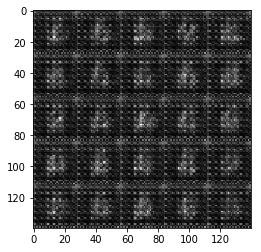


 Epoch 1/2 Step 100 Discriminator Loss: 2.8067 ...  Generator Loss: 0.1372

 Epoch 1/2 Step 110 Discriminator Loss: 2.6005 ...  Generator Loss: 0.1705

 Epoch 1/2 Step 120 Discriminator Loss: 2.7011 ...  Generator Loss: 0.1571

 Epoch 1/2 Step 130 Discriminator Loss: 2.5842 ...  Generator Loss: 0.1781

 Epoch 1/2 Step 140 Discriminator Loss: 2.5947 ...  Generator Loss: 0.1816

 Epoch 1/2 Step 150 Discriminator Loss: 2.3474 ...  Generator Loss: 0.2610

 Epoch 1/2 Step 160 Discriminator Loss: 2.7063 ...  Generator Loss: 0.1532

 Epoch 1/2 Step 170 Discriminator Loss: 2.3300 ...  Generator Loss: 0.2294

 Epoch 1/2 Step 180 Discriminator Loss: 2.2216 ...  Generator Loss: 0.2597

 Epoch 1/2 Step 190 Discriminator Loss: 2.3382 ...  Generator Loss: 0.2655


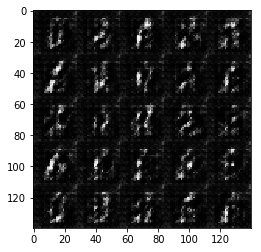


 Epoch 1/2 Step 200 Discriminator Loss: 2.2990 ...  Generator Loss: 0.2465

 Epoch 1/2 Step 210 Discriminator Loss: 2.3297 ...  Generator Loss: 0.2341

 Epoch 1/2 Step 220 Discriminator Loss: 2.1811 ...  Generator Loss: 0.2703

 Epoch 1/2 Step 230 Discriminator Loss: 2.1648 ...  Generator Loss: 0.2835

 Epoch 1/2 Step 240 Discriminator Loss: 2.0336 ...  Generator Loss: 0.3496

 Epoch 1/2 Step 250 Discriminator Loss: 2.0686 ...  Generator Loss: 0.3353

 Epoch 1/2 Step 260 Discriminator Loss: 2.1693 ...  Generator Loss: 0.3064

 Epoch 1/2 Step 270 Discriminator Loss: 2.1285 ...  Generator Loss: 0.3100

 Epoch 1/2 Step 280 Discriminator Loss: 2.0948 ...  Generator Loss: 0.3361

 Epoch 1/2 Step 290 Discriminator Loss: 2.0429 ...  Generator Loss: 0.3549


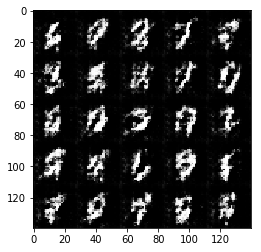


 Epoch 1/2 Step 300 Discriminator Loss: 2.0795 ...  Generator Loss: 0.3333

 Epoch 1/2 Step 310 Discriminator Loss: 1.9843 ...  Generator Loss: 0.3833

 Epoch 1/2 Step 320 Discriminator Loss: 1.9141 ...  Generator Loss: 0.3824

 Epoch 1/2 Step 330 Discriminator Loss: 2.0090 ...  Generator Loss: 0.3601

 Epoch 1/2 Step 340 Discriminator Loss: 1.8894 ...  Generator Loss: 0.4056

 Epoch 1/2 Step 350 Discriminator Loss: 1.8404 ...  Generator Loss: 0.4267

 Epoch 1/2 Step 360 Discriminator Loss: 1.9438 ...  Generator Loss: 0.3779

 Epoch 1/2 Step 370 Discriminator Loss: 2.0023 ...  Generator Loss: 0.3480

 Epoch 1/2 Step 380 Discriminator Loss: 1.8460 ...  Generator Loss: 0.4335

 Epoch 1/2 Step 390 Discriminator Loss: 1.8043 ...  Generator Loss: 0.4558


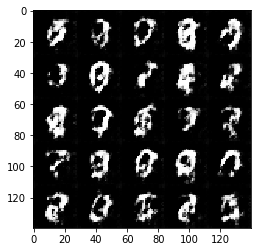


 Epoch 1/2 Step 400 Discriminator Loss: 1.7918 ...  Generator Loss: 0.4405

 Epoch 1/2 Step 410 Discriminator Loss: 1.6951 ...  Generator Loss: 0.4760

 Epoch 1/2 Step 420 Discriminator Loss: 1.8303 ...  Generator Loss: 0.4442

 Epoch 1/2 Step 430 Discriminator Loss: 1.9325 ...  Generator Loss: 0.4164

 Epoch 1/2 Step 440 Discriminator Loss: 1.9044 ...  Generator Loss: 0.4034

 Epoch 1/2 Step 450 Discriminator Loss: 1.7551 ...  Generator Loss: 0.4854

 Epoch 1/2 Step 460 Discriminator Loss: 1.6957 ...  Generator Loss: 0.5118

 Epoch 1/2 Step 470 Discriminator Loss: 1.7136 ...  Generator Loss: 0.4968

 Epoch 1/2 Step 480 Discriminator Loss: 1.7939 ...  Generator Loss: 0.4525

 Epoch 1/2 Step 490 Discriminator Loss: 1.8466 ...  Generator Loss: 0.4387


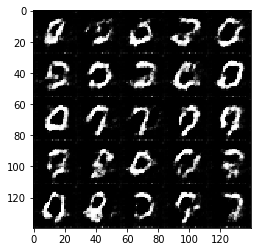


 Epoch 1/2 Step 500 Discriminator Loss: 1.7673 ...  Generator Loss: 0.4662

 Epoch 1/2 Step 510 Discriminator Loss: 1.7091 ...  Generator Loss: 0.4810

 Epoch 1/2 Step 520 Discriminator Loss: 1.8094 ...  Generator Loss: 0.4533

 Epoch 1/2 Step 530 Discriminator Loss: 1.7092 ...  Generator Loss: 0.5082

 Epoch 1/2 Step 540 Discriminator Loss: 1.6891 ...  Generator Loss: 0.5022

 Epoch 1/2 Step 550 Discriminator Loss: 1.6719 ...  Generator Loss: 0.5031

 Epoch 1/2 Step 560 Discriminator Loss: 1.5897 ...  Generator Loss: 0.6016

 Epoch 1/2 Step 570 Discriminator Loss: 1.7367 ...  Generator Loss: 0.4705

 Epoch 1/2 Step 580 Discriminator Loss: 1.8030 ...  Generator Loss: 0.4755

 Epoch 1/2 Step 590 Discriminator Loss: 1.7334 ...  Generator Loss: 0.4917


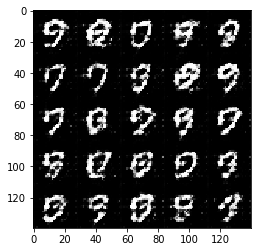


 Epoch 1/2 Step 600 Discriminator Loss: 1.7126 ...  Generator Loss: 0.5278

 Epoch 1/2 Step 610 Discriminator Loss: 1.7419 ...  Generator Loss: 0.5172

 Epoch 1/2 Step 620 Discriminator Loss: 1.6330 ...  Generator Loss: 0.5755

 Epoch 1/2 Step 630 Discriminator Loss: 1.6499 ...  Generator Loss: 0.5197

 Epoch 1/2 Step 640 Discriminator Loss: 1.7562 ...  Generator Loss: 0.4908

 Epoch 1/2 Step 650 Discriminator Loss: 1.7994 ...  Generator Loss: 0.4971

 Epoch 1/2 Step 660 Discriminator Loss: 1.6899 ...  Generator Loss: 0.4908

 Epoch 1/2 Step 670 Discriminator Loss: 1.7609 ...  Generator Loss: 0.4905

 Epoch 1/2 Step 680 Discriminator Loss: 1.6478 ...  Generator Loss: 0.5494

 Epoch 1/2 Step 690 Discriminator Loss: 1.5727 ...  Generator Loss: 0.5893


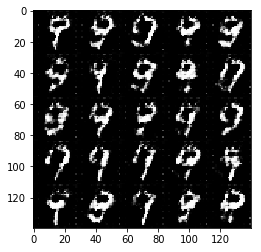


 Epoch 1/2 Step 700 Discriminator Loss: 1.6215 ...  Generator Loss: 0.5328

 Epoch 1/2 Step 710 Discriminator Loss: 1.7740 ...  Generator Loss: 0.4799

 Epoch 1/2 Step 720 Discriminator Loss: 1.8328 ...  Generator Loss: 0.4599

 Epoch 1/2 Step 730 Discriminator Loss: 1.7157 ...  Generator Loss: 0.5049

 Epoch 1/2 Step 740 Discriminator Loss: 1.6919 ...  Generator Loss: 0.5345

 Epoch 1/2 Step 750 Discriminator Loss: 1.6378 ...  Generator Loss: 0.6281

 Epoch 1/2 Step 760 Discriminator Loss: 1.7334 ...  Generator Loss: 0.5397

 Epoch 1/2 Step 770 Discriminator Loss: 1.7636 ...  Generator Loss: 0.5270

 Epoch 1/2 Step 780 Discriminator Loss: 1.6919 ...  Generator Loss: 0.5207

 Epoch 1/2 Step 790 Discriminator Loss: 1.6322 ...  Generator Loss: 0.5278


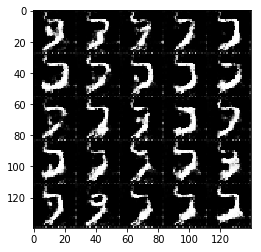


 Epoch 1/2 Step 800 Discriminator Loss: 1.6133 ...  Generator Loss: 0.5631

 Epoch 1/2 Step 810 Discriminator Loss: 1.5869 ...  Generator Loss: 0.6064

 Epoch 1/2 Step 820 Discriminator Loss: 1.6753 ...  Generator Loss: 0.5643

 Epoch 1/2 Step 830 Discriminator Loss: 1.6589 ...  Generator Loss: 0.5166

 Epoch 1/2 Step 840 Discriminator Loss: 1.6215 ...  Generator Loss: 0.5989

 Epoch 1/2 Step 850 Discriminator Loss: 1.6743 ...  Generator Loss: 0.5558

 Epoch 1/2 Step 860 Discriminator Loss: 1.6607 ...  Generator Loss: 0.6171

 Epoch 1/2 Step 870 Discriminator Loss: 1.6563 ...  Generator Loss: 0.5367

 Epoch 1/2 Step 880 Discriminator Loss: 1.6653 ...  Generator Loss: 0.5381

 Epoch 1/2 Step 890 Discriminator Loss: 1.5778 ...  Generator Loss: 0.6329


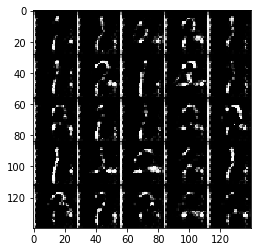


 Epoch 1/2 Step 900 Discriminator Loss: 1.6666 ...  Generator Loss: 0.5292

 Epoch 1/2 Step 910 Discriminator Loss: 1.5982 ...  Generator Loss: 0.6490

 Epoch 1/2 Step 920 Discriminator Loss: 1.6353 ...  Generator Loss: 0.5300

 Epoch 1/2 Step 930 Discriminator Loss: 1.5354 ...  Generator Loss: 0.6162

 Epoch 1/2 Step 940 Discriminator Loss: 1.7745 ...  Generator Loss: 0.5717

 Epoch 1/2 Step 950 Discriminator Loss: 1.7674 ...  Generator Loss: 0.4982

 Epoch 1/2 Step 960 Discriminator Loss: 1.6934 ...  Generator Loss: 0.5435

 Epoch 1/2 Step 970 Discriminator Loss: 1.6235 ...  Generator Loss: 0.5490

 Epoch 1/2 Step 980 Discriminator Loss: 1.5514 ...  Generator Loss: 0.6235

 Epoch 1/2 Step 990 Discriminator Loss: 1.6261 ...  Generator Loss: 0.5648


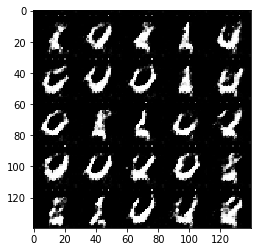


 Epoch 1/2 Step 1000 Discriminator Loss: 1.5152 ...  Generator Loss: 0.6664

 Epoch 1/2 Step 1010 Discriminator Loss: 1.6595 ...  Generator Loss: 0.5665

 Epoch 1/2 Step 1020 Discriminator Loss: 1.6496 ...  Generator Loss: 0.5797

 Epoch 1/2 Step 1030 Discriminator Loss: 1.5636 ...  Generator Loss: 0.6224

 Epoch 1/2 Step 1040 Discriminator Loss: 1.6267 ...  Generator Loss: 0.5607

 Epoch 1/2 Step 1050 Discriminator Loss: 1.5584 ...  Generator Loss: 0.6304

 Epoch 1/2 Step 1060 Discriminator Loss: 1.5223 ...  Generator Loss: 0.6608

 Epoch 1/2 Step 1070 Discriminator Loss: 1.6131 ...  Generator Loss: 0.6012

 Epoch 1/2 Step 1080 Discriminator Loss: 1.5075 ...  Generator Loss: 0.6785

 Epoch 1/2 Step 1090 Discriminator Loss: 1.5475 ...  Generator Loss: 0.6175


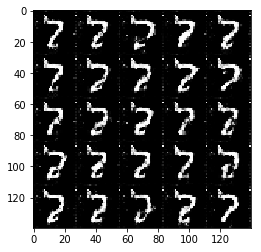


 Epoch 1/2 Step 1100 Discriminator Loss: 1.5119 ...  Generator Loss: 0.6578

 Epoch 1/2 Step 1110 Discriminator Loss: 1.5215 ...  Generator Loss: 0.6824

 Epoch 1/2 Step 1120 Discriminator Loss: 1.5364 ...  Generator Loss: 0.6363

 Epoch 1/2 Step 1130 Discriminator Loss: 1.5447 ...  Generator Loss: 0.6431

 Epoch 1/2 Step 1140 Discriminator Loss: 1.5078 ...  Generator Loss: 0.6936

 Epoch 1/2 Step 1150 Discriminator Loss: 1.3866 ...  Generator Loss: 0.7949

 Epoch 1/2 Step 1160 Discriminator Loss: 1.4621 ...  Generator Loss: 0.7789

 Epoch 1/2 Step 1170 Discriminator Loss: 1.4161 ...  Generator Loss: 0.7152

 Epoch 1/2 Step 1180 Discriminator Loss: 1.4948 ...  Generator Loss: 0.6216

 Epoch 1/2 Step 1190 Discriminator Loss: 1.5649 ...  Generator Loss: 0.7423


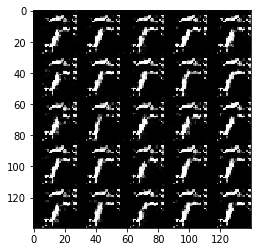


 Epoch 1/2 Step 1200 Discriminator Loss: 1.4313 ...  Generator Loss: 0.6445

 Epoch 1/2 Step 1210 Discriminator Loss: 1.4692 ...  Generator Loss: 0.6949

 Epoch 1/2 Step 1220 Discriminator Loss: 1.4026 ...  Generator Loss: 0.7610

 Epoch 1/2 Step 1230 Discriminator Loss: 1.3727 ...  Generator Loss: 0.8088

 Epoch 1/2 Step 1240 Discriminator Loss: 1.4842 ...  Generator Loss: 0.6361

 Epoch 1/2 Step 1250 Discriminator Loss: 1.5026 ...  Generator Loss: 0.7043

 Epoch 1/2 Step 1260 Discriminator Loss: 1.4522 ...  Generator Loss: 0.7131

 Epoch 1/2 Step 1270 Discriminator Loss: 1.4652 ...  Generator Loss: 0.8076

 Epoch 1/2 Step 1280 Discriminator Loss: 1.3467 ...  Generator Loss: 0.7837

 Epoch 1/2 Step 1290 Discriminator Loss: 1.2689 ...  Generator Loss: 0.8115


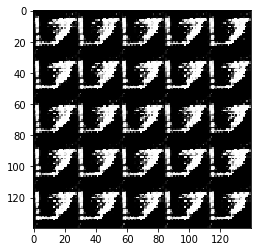


 Epoch 1/2 Step 1300 Discriminator Loss: 1.4252 ...  Generator Loss: 0.7651

 Epoch 1/2 Step 1310 Discriminator Loss: 1.4772 ...  Generator Loss: 0.6814

 Epoch 1/2 Step 1320 Discriminator Loss: 1.5928 ...  Generator Loss: 0.6948

 Epoch 1/2 Step 1330 Discriminator Loss: 1.4791 ...  Generator Loss: 0.7058

 Epoch 1/2 Step 1340 Discriminator Loss: 1.3854 ...  Generator Loss: 0.8400

 Epoch 1/2 Step 1350 Discriminator Loss: 1.2683 ...  Generator Loss: 0.8380

 Epoch 1/2 Step 1360 Discriminator Loss: 1.2399 ...  Generator Loss: 0.8973

 Epoch 1/2 Step 1370 Discriminator Loss: 1.3714 ...  Generator Loss: 0.8272

 Epoch 1/2 Step 1380 Discriminator Loss: 1.3971 ...  Generator Loss: 0.8378

 Epoch 1/2 Step 1390 Discriminator Loss: 1.4187 ...  Generator Loss: 0.7170


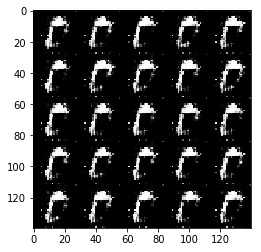


 Epoch 1/2 Step 1400 Discriminator Loss: 1.4905 ...  Generator Loss: 0.6873

 Epoch 1/2 Step 1410 Discriminator Loss: 1.3975 ...  Generator Loss: 0.8013

 Epoch 1/2 Step 1420 Discriminator Loss: 1.4052 ...  Generator Loss: 0.7889

 Epoch 1/2 Step 1430 Discriminator Loss: 1.3992 ...  Generator Loss: 0.7571

 Epoch 1/2 Step 1440 Discriminator Loss: 1.2963 ...  Generator Loss: 0.8572

 Epoch 1/2 Step 1450 Discriminator Loss: 1.2984 ...  Generator Loss: 0.7616

 Epoch 1/2 Step 1460 Discriminator Loss: 1.3701 ...  Generator Loss: 0.7492

 Epoch 1/2 Step 1470 Discriminator Loss: 1.4874 ...  Generator Loss: 0.8050

 Epoch 1/2 Step 1480 Discriminator Loss: 1.4706 ...  Generator Loss: 0.7591

 Epoch 1/2 Step 1490 Discriminator Loss: 1.5255 ...  Generator Loss: 0.7425


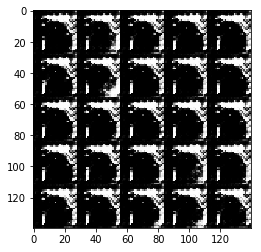


 Epoch 1/2 Step 1500 Discriminator Loss: 1.2698 ...  Generator Loss: 0.8613

 Epoch 1/2 Step 1510 Discriminator Loss: 1.3317 ...  Generator Loss: 0.9394

 Epoch 1/2 Step 1520 Discriminator Loss: 1.2480 ...  Generator Loss: 0.8443

 Epoch 1/2 Step 1530 Discriminator Loss: 1.2370 ...  Generator Loss: 0.8911

 Epoch 1/2 Step 1540 Discriminator Loss: 1.3979 ...  Generator Loss: 0.8360

 Epoch 1/2 Step 1550 Discriminator Loss: 1.4726 ...  Generator Loss: 0.6666

 Epoch 1/2 Step 1560 Discriminator Loss: 1.3559 ...  Generator Loss: 0.8850

 Epoch 1/2 Step 1570 Discriminator Loss: 1.3924 ...  Generator Loss: 0.7583

 Epoch 1/2 Step 1580 Discriminator Loss: 1.3745 ...  Generator Loss: 0.7509

 Epoch 1/2 Step 1590 Discriminator Loss: 1.4335 ...  Generator Loss: 0.7852


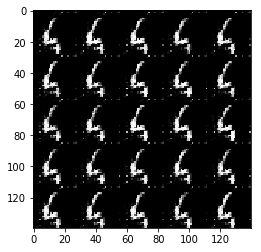


 Epoch 1/2 Step 1600 Discriminator Loss: 1.3775 ...  Generator Loss: 0.7787

 Epoch 1/2 Step 1610 Discriminator Loss: 1.3678 ...  Generator Loss: 0.7424

 Epoch 1/2 Step 1620 Discriminator Loss: 1.3827 ...  Generator Loss: 0.7895

 Epoch 1/2 Step 1630 Discriminator Loss: 1.3549 ...  Generator Loss: 0.7583

 Epoch 1/2 Step 1640 Discriminator Loss: 1.3444 ...  Generator Loss: 0.8450

 Epoch 1/2 Step 1650 Discriminator Loss: 1.2575 ...  Generator Loss: 0.9135

 Epoch 1/2 Step 1660 Discriminator Loss: 1.3611 ...  Generator Loss: 0.7800

 Epoch 1/2 Step 1670 Discriminator Loss: 1.3749 ...  Generator Loss: 0.7714

 Epoch 1/2 Step 1680 Discriminator Loss: 1.3288 ...  Generator Loss: 0.8420

 Epoch 1/2 Step 1690 Discriminator Loss: 1.3888 ...  Generator Loss: 0.8100


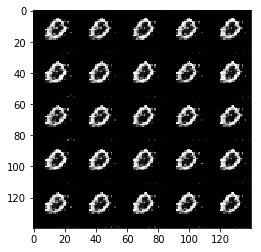


 Epoch 1/2 Step 1700 Discriminator Loss: 1.3933 ...  Generator Loss: 0.8311

 Epoch 1/2 Step 1710 Discriminator Loss: 1.1850 ...  Generator Loss: 0.9186

 Epoch 1/2 Step 1720 Discriminator Loss: 1.1882 ...  Generator Loss: 0.8896

 Epoch 1/2 Step 1730 Discriminator Loss: 1.3778 ...  Generator Loss: 0.8056

 Epoch 1/2 Step 1740 Discriminator Loss: 1.3267 ...  Generator Loss: 0.8388

 Epoch 1/2 Step 1750 Discriminator Loss: 1.2431 ...  Generator Loss: 0.8507

 Epoch 1/2 Step 1760 Discriminator Loss: 1.2518 ...  Generator Loss: 0.8321

 Epoch 1/2 Step 1770 Discriminator Loss: 1.3713 ...  Generator Loss: 0.7774

 Epoch 1/2 Step 1780 Discriminator Loss: 1.3661 ...  Generator Loss: 0.8240

 Epoch 1/2 Step 1790 Discriminator Loss: 1.5224 ...  Generator Loss: 0.7007


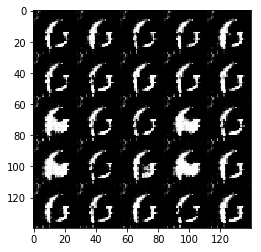


 Epoch 1/2 Step 1800 Discriminator Loss: 1.4830 ...  Generator Loss: 0.6805

 Epoch 1/2 Step 1810 Discriminator Loss: 1.6213 ...  Generator Loss: 0.6801

 Epoch 1/2 Step 1820 Discriminator Loss: 1.4183 ...  Generator Loss: 0.6902

 Epoch 1/2 Step 1830 Discriminator Loss: 1.3927 ...  Generator Loss: 0.7979

 Epoch 1/2 Step 1840 Discriminator Loss: 1.2320 ...  Generator Loss: 0.8835

 Epoch 1/2 Step 1850 Discriminator Loss: 1.4026 ...  Generator Loss: 0.7324

 Epoch 1/2 Step 1860 Discriminator Loss: 1.5154 ...  Generator Loss: 0.6943

 Epoch 1/2 Step 1870 Discriminator Loss: 1.5108 ...  Generator Loss: 0.6765

 Epoch 1/2... Discriminator Loss: 1.4823... Generator Loss: 0.6900

 Epoch 2/2 Step 1880 Discriminator Loss: 1.5175 ...  Generator Loss: 0.7344

 Epoch 2/2 Step 1890 Discriminator Loss: 1.5566 ...  Generator Loss: 0.7160


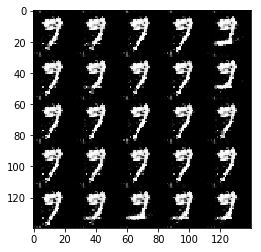


 Epoch 2/2 Step 1900 Discriminator Loss: 1.5285 ...  Generator Loss: 0.7029

 Epoch 2/2 Step 1910 Discriminator Loss: 1.5060 ...  Generator Loss: 0.7742

 Epoch 2/2 Step 1920 Discriminator Loss: 1.3852 ...  Generator Loss: 0.7524

 Epoch 2/2 Step 1930 Discriminator Loss: 1.4915 ...  Generator Loss: 0.7200

 Epoch 2/2 Step 1940 Discriminator Loss: 1.4351 ...  Generator Loss: 0.7872

 Epoch 2/2 Step 1950 Discriminator Loss: 1.4188 ...  Generator Loss: 0.7648

 Epoch 2/2 Step 1960 Discriminator Loss: 1.4345 ...  Generator Loss: 0.7662

 Epoch 2/2 Step 1970 Discriminator Loss: 1.4015 ...  Generator Loss: 0.7764

 Epoch 2/2 Step 1980 Discriminator Loss: 1.3662 ...  Generator Loss: 0.8623

 Epoch 2/2 Step 1990 Discriminator Loss: 1.5160 ...  Generator Loss: 0.7771


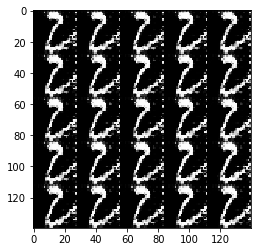


 Epoch 2/2 Step 2000 Discriminator Loss: 1.3424 ...  Generator Loss: 0.8111

 Epoch 2/2 Step 2010 Discriminator Loss: 1.4250 ...  Generator Loss: 0.7705

 Epoch 2/2 Step 2020 Discriminator Loss: 1.3679 ...  Generator Loss: 0.8573

 Epoch 2/2 Step 2030 Discriminator Loss: 1.4296 ...  Generator Loss: 0.8071

 Epoch 2/2 Step 2040 Discriminator Loss: 1.2432 ...  Generator Loss: 0.8817

 Epoch 2/2 Step 2050 Discriminator Loss: 1.3563 ...  Generator Loss: 0.8867

 Epoch 2/2 Step 2060 Discriminator Loss: 1.3778 ...  Generator Loss: 0.8358

 Epoch 2/2 Step 2070 Discriminator Loss: 1.3800 ...  Generator Loss: 0.8579

 Epoch 2/2 Step 2080 Discriminator Loss: 1.2650 ...  Generator Loss: 0.8227

 Epoch 2/2 Step 2090 Discriminator Loss: 1.2409 ...  Generator Loss: 0.9937


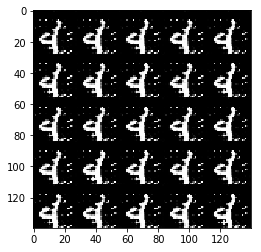


 Epoch 2/2 Step 2100 Discriminator Loss: 1.3135 ...  Generator Loss: 0.8126

 Epoch 2/2 Step 2110 Discriminator Loss: 1.2682 ...  Generator Loss: 0.8524

 Epoch 2/2 Step 2120 Discriminator Loss: 1.2517 ...  Generator Loss: 0.8665

 Epoch 2/2 Step 2130 Discriminator Loss: 1.2125 ...  Generator Loss: 0.9777

 Epoch 2/2 Step 2140 Discriminator Loss: 1.0679 ...  Generator Loss: 1.0186

 Epoch 2/2 Step 2150 Discriminator Loss: 1.1495 ...  Generator Loss: 0.9819

 Epoch 2/2 Step 2160 Discriminator Loss: 1.1753 ...  Generator Loss: 1.2383

 Epoch 2/2 Step 2170 Discriminator Loss: 1.0449 ...  Generator Loss: 0.9899

 Epoch 2/2 Step 2180 Discriminator Loss: 1.0606 ...  Generator Loss: 1.0343

 Epoch 2/2 Step 2190 Discriminator Loss: 1.0538 ...  Generator Loss: 1.2043


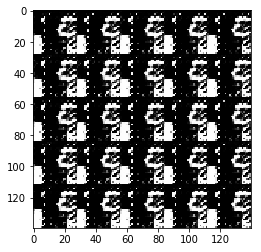


 Epoch 2/2 Step 2200 Discriminator Loss: 1.0933 ...  Generator Loss: 1.0433

 Epoch 2/2 Step 2210 Discriminator Loss: 1.2635 ...  Generator Loss: 0.8774

 Epoch 2/2 Step 2220 Discriminator Loss: 1.2602 ...  Generator Loss: 0.8020

 Epoch 2/2 Step 2230 Discriminator Loss: 1.2733 ...  Generator Loss: 0.9560

 Epoch 2/2 Step 2240 Discriminator Loss: 1.3070 ...  Generator Loss: 0.9814

 Epoch 2/2 Step 2250 Discriminator Loss: 1.2524 ...  Generator Loss: 0.8523

 Epoch 2/2 Step 2260 Discriminator Loss: 1.3234 ...  Generator Loss: 1.0453

 Epoch 2/2 Step 2270 Discriminator Loss: 1.2943 ...  Generator Loss: 0.8791

 Epoch 2/2 Step 2280 Discriminator Loss: 1.2300 ...  Generator Loss: 0.8974

 Epoch 2/2 Step 2290 Discriminator Loss: 1.2550 ...  Generator Loss: 0.8905


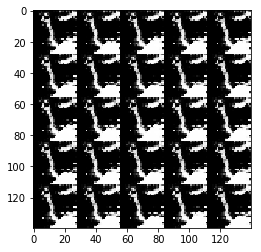


 Epoch 2/2 Step 2300 Discriminator Loss: 1.2743 ...  Generator Loss: 0.8787

 Epoch 2/2 Step 2310 Discriminator Loss: 1.1831 ...  Generator Loss: 0.9808

 Epoch 2/2 Step 2320 Discriminator Loss: 1.3285 ...  Generator Loss: 0.7635

 Epoch 2/2 Step 2330 Discriminator Loss: 1.3603 ...  Generator Loss: 0.9514

 Epoch 2/2 Step 2340 Discriminator Loss: 1.3663 ...  Generator Loss: 0.7387

 Epoch 2/2 Step 2350 Discriminator Loss: 1.2173 ...  Generator Loss: 0.9483

 Epoch 2/2 Step 2360 Discriminator Loss: 1.3620 ...  Generator Loss: 0.9031

 Epoch 2/2 Step 2370 Discriminator Loss: 1.5108 ...  Generator Loss: 0.7036

 Epoch 2/2 Step 2380 Discriminator Loss: 1.4461 ...  Generator Loss: 0.8080

 Epoch 2/2 Step 2390 Discriminator Loss: 1.4379 ...  Generator Loss: 0.8185


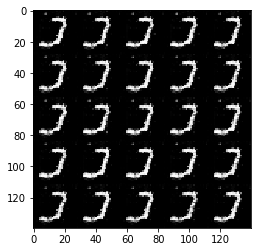


 Epoch 2/2 Step 2400 Discriminator Loss: 1.2718 ...  Generator Loss: 0.8095

 Epoch 2/2 Step 2410 Discriminator Loss: 1.2296 ...  Generator Loss: 0.9616

 Epoch 2/2 Step 2420 Discriminator Loss: 1.2273 ...  Generator Loss: 0.9317

 Epoch 2/2 Step 2430 Discriminator Loss: 1.5620 ...  Generator Loss: 0.8104

 Epoch 2/2 Step 2440 Discriminator Loss: 1.4999 ...  Generator Loss: 0.6701

 Epoch 2/2 Step 2450 Discriminator Loss: 1.4791 ...  Generator Loss: 0.8013

 Epoch 2/2 Step 2460 Discriminator Loss: 1.4361 ...  Generator Loss: 0.7282

 Epoch 2/2 Step 2470 Discriminator Loss: 1.3767 ...  Generator Loss: 0.7235

 Epoch 2/2 Step 2480 Discriminator Loss: 1.5495 ...  Generator Loss: 0.6995

 Epoch 2/2 Step 2490 Discriminator Loss: 1.4633 ...  Generator Loss: 0.6979


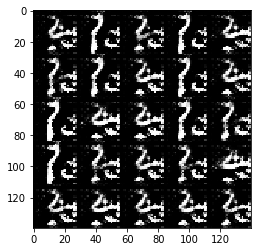


 Epoch 2/2 Step 2500 Discriminator Loss: 1.4873 ...  Generator Loss: 0.7197

 Epoch 2/2 Step 2510 Discriminator Loss: 1.4950 ...  Generator Loss: 0.7058

 Epoch 2/2 Step 2520 Discriminator Loss: 1.4566 ...  Generator Loss: 0.7526

 Epoch 2/2 Step 2530 Discriminator Loss: 1.5077 ...  Generator Loss: 0.6824

 Epoch 2/2 Step 2540 Discriminator Loss: 1.5265 ...  Generator Loss: 0.7447

 Epoch 2/2 Step 2550 Discriminator Loss: 1.5232 ...  Generator Loss: 0.7279

 Epoch 2/2 Step 2560 Discriminator Loss: 1.4440 ...  Generator Loss: 0.7045

 Epoch 2/2 Step 2570 Discriminator Loss: 1.4392 ...  Generator Loss: 0.7248

 Epoch 2/2 Step 2580 Discriminator Loss: 1.3248 ...  Generator Loss: 0.8577

 Epoch 2/2 Step 2590 Discriminator Loss: 1.3468 ...  Generator Loss: 0.7619


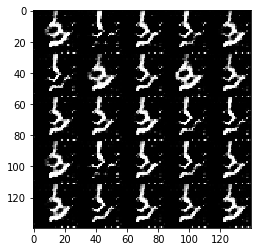


 Epoch 2/2 Step 2600 Discriminator Loss: 1.5300 ...  Generator Loss: 0.7086

 Epoch 2/2 Step 2610 Discriminator Loss: 1.5293 ...  Generator Loss: 0.6696

 Epoch 2/2 Step 2620 Discriminator Loss: 1.5294 ...  Generator Loss: 0.6790

 Epoch 2/2 Step 2630 Discriminator Loss: 1.5230 ...  Generator Loss: 0.7529

 Epoch 2/2 Step 2640 Discriminator Loss: 1.4566 ...  Generator Loss: 0.7997

 Epoch 2/2 Step 2650 Discriminator Loss: 1.4988 ...  Generator Loss: 0.6644

 Epoch 2/2 Step 2660 Discriminator Loss: 1.5350 ...  Generator Loss: 0.6814

 Epoch 2/2 Step 2670 Discriminator Loss: 1.5342 ...  Generator Loss: 0.7240

 Epoch 2/2 Step 2680 Discriminator Loss: 1.5986 ...  Generator Loss: 0.5997

 Epoch 2/2 Step 2690 Discriminator Loss: 1.5865 ...  Generator Loss: 0.6543


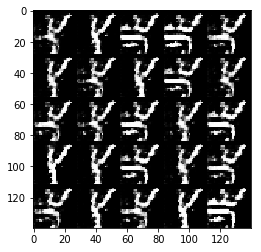


 Epoch 2/2 Step 2700 Discriminator Loss: 1.4919 ...  Generator Loss: 0.6953

 Epoch 2/2 Step 2710 Discriminator Loss: 1.4356 ...  Generator Loss: 0.7747

 Epoch 2/2 Step 2720 Discriminator Loss: 1.3611 ...  Generator Loss: 0.7982

 Epoch 2/2 Step 2730 Discriminator Loss: 1.4026 ...  Generator Loss: 0.7401

 Epoch 2/2 Step 2740 Discriminator Loss: 1.3670 ...  Generator Loss: 0.7840

 Epoch 2/2 Step 2750 Discriminator Loss: 1.3257 ...  Generator Loss: 0.8286

 Epoch 2/2 Step 2760 Discriminator Loss: 1.3988 ...  Generator Loss: 0.6951

 Epoch 2/2 Step 2770 Discriminator Loss: 1.4833 ...  Generator Loss: 0.7704

 Epoch 2/2 Step 2780 Discriminator Loss: 1.4546 ...  Generator Loss: 0.7662

 Epoch 2/2 Step 2790 Discriminator Loss: 1.4483 ...  Generator Loss: 0.7086


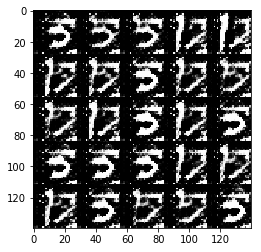


 Epoch 2/2 Step 2800 Discriminator Loss: 1.5267 ...  Generator Loss: 0.6237

 Epoch 2/2 Step 2810 Discriminator Loss: 1.4317 ...  Generator Loss: 0.7407

 Epoch 2/2 Step 2820 Discriminator Loss: 1.5344 ...  Generator Loss: 0.7327

 Epoch 2/2 Step 2830 Discriminator Loss: 1.6127 ...  Generator Loss: 0.6436

 Epoch 2/2 Step 2840 Discriminator Loss: 1.5773 ...  Generator Loss: 0.7206

 Epoch 2/2 Step 2850 Discriminator Loss: 1.4520 ...  Generator Loss: 0.7147

 Epoch 2/2 Step 2860 Discriminator Loss: 1.5593 ...  Generator Loss: 0.6817

 Epoch 2/2 Step 2870 Discriminator Loss: 1.5018 ...  Generator Loss: 0.7485

 Epoch 2/2 Step 2880 Discriminator Loss: 1.5754 ...  Generator Loss: 0.6862

 Epoch 2/2 Step 2890 Discriminator Loss: 1.4814 ...  Generator Loss: 0.7154


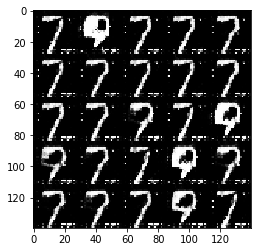


 Epoch 2/2 Step 2900 Discriminator Loss: 1.3755 ...  Generator Loss: 0.8335

 Epoch 2/2 Step 2910 Discriminator Loss: 1.3581 ...  Generator Loss: 0.7647

 Epoch 2/2 Step 2920 Discriminator Loss: 1.4456 ...  Generator Loss: 0.7477

 Epoch 2/2 Step 2930 Discriminator Loss: 1.4913 ...  Generator Loss: 0.6874

 Epoch 2/2 Step 2940 Discriminator Loss: 1.4575 ...  Generator Loss: 0.7933

 Epoch 2/2 Step 2950 Discriminator Loss: 1.4474 ...  Generator Loss: 0.7309

 Epoch 2/2 Step 2960 Discriminator Loss: 1.4552 ...  Generator Loss: 0.7393

 Epoch 2/2 Step 2970 Discriminator Loss: 1.4045 ...  Generator Loss: 0.7471

 Epoch 2/2 Step 2980 Discriminator Loss: 1.4719 ...  Generator Loss: 0.7329

 Epoch 2/2 Step 2990 Discriminator Loss: 1.4000 ...  Generator Loss: 0.8152


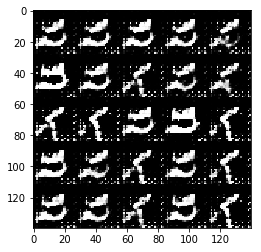


 Epoch 2/2 Step 3000 Discriminator Loss: 1.3884 ...  Generator Loss: 0.7858

 Epoch 2/2 Step 3010 Discriminator Loss: 1.4477 ...  Generator Loss: 0.7694

 Epoch 2/2 Step 3020 Discriminator Loss: 1.2704 ...  Generator Loss: 0.8075

 Epoch 2/2 Step 3030 Discriminator Loss: 1.4059 ...  Generator Loss: 0.7944

 Epoch 2/2 Step 3040 Discriminator Loss: 1.4269 ...  Generator Loss: 0.7184

 Epoch 2/2 Step 3050 Discriminator Loss: 1.4429 ...  Generator Loss: 0.7672

 Epoch 2/2 Step 3060 Discriminator Loss: 1.5239 ...  Generator Loss: 0.7141

 Epoch 2/2 Step 3070 Discriminator Loss: 1.5491 ...  Generator Loss: 0.7184

 Epoch 2/2 Step 3080 Discriminator Loss: 1.4856 ...  Generator Loss: 0.7274

 Epoch 2/2 Step 3090 Discriminator Loss: 1.4959 ...  Generator Loss: 0.7001


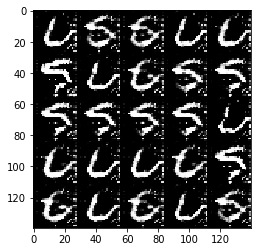


 Epoch 2/2 Step 3100 Discriminator Loss: 1.4205 ...  Generator Loss: 0.7176

 Epoch 2/2 Step 3110 Discriminator Loss: 1.4798 ...  Generator Loss: 0.7533

 Epoch 2/2 Step 3120 Discriminator Loss: 1.5049 ...  Generator Loss: 0.6959

 Epoch 2/2 Step 3130 Discriminator Loss: 1.3646 ...  Generator Loss: 0.7810

 Epoch 2/2 Step 3140 Discriminator Loss: 1.4173 ...  Generator Loss: 0.7584

 Epoch 2/2 Step 3150 Discriminator Loss: 1.5447 ...  Generator Loss: 0.6844

 Epoch 2/2 Step 3160 Discriminator Loss: 1.5423 ...  Generator Loss: 0.6945

 Epoch 2/2 Step 3170 Discriminator Loss: 1.5882 ...  Generator Loss: 0.6932

 Epoch 2/2 Step 3180 Discriminator Loss: 1.4817 ...  Generator Loss: 0.7274

 Epoch 2/2 Step 3190 Discriminator Loss: 1.5040 ...  Generator Loss: 0.6578


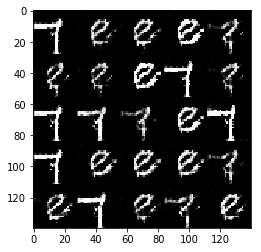


 Epoch 2/2 Step 3200 Discriminator Loss: 1.5222 ...  Generator Loss: 0.7050

 Epoch 2/2 Step 3210 Discriminator Loss: 1.4335 ...  Generator Loss: 0.7253

 Epoch 2/2 Step 3220 Discriminator Loss: 1.4753 ...  Generator Loss: 0.7524

 Epoch 2/2 Step 3230 Discriminator Loss: 1.4244 ...  Generator Loss: 0.7473

 Epoch 2/2 Step 3240 Discriminator Loss: 1.4616 ...  Generator Loss: 0.7176

 Epoch 2/2 Step 3250 Discriminator Loss: 1.4832 ...  Generator Loss: 0.7280

 Epoch 2/2 Step 3260 Discriminator Loss: 1.4332 ...  Generator Loss: 0.7895

 Epoch 2/2 Step 3270 Discriminator Loss: 1.5291 ...  Generator Loss: 0.6837

 Epoch 2/2 Step 3280 Discriminator Loss: 1.4714 ...  Generator Loss: 0.7308

 Epoch 2/2 Step 3290 Discriminator Loss: 1.3712 ...  Generator Loss: 0.7704


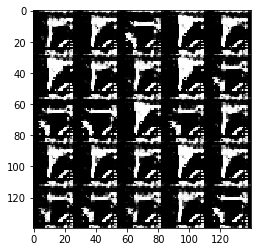


 Epoch 2/2 Step 3300 Discriminator Loss: 1.3791 ...  Generator Loss: 0.7644

 Epoch 2/2 Step 3310 Discriminator Loss: 1.3495 ...  Generator Loss: 0.7912

 Epoch 2/2 Step 3320 Discriminator Loss: 1.4524 ...  Generator Loss: 0.7862

 Epoch 2/2 Step 3330 Discriminator Loss: 1.4691 ...  Generator Loss: 0.7183

 Epoch 2/2 Step 3340 Discriminator Loss: 1.5658 ...  Generator Loss: 0.6867

 Epoch 2/2 Step 3350 Discriminator Loss: 1.4767 ...  Generator Loss: 0.7542

 Epoch 2/2 Step 3360 Discriminator Loss: 1.4680 ...  Generator Loss: 0.7092

 Epoch 2/2 Step 3370 Discriminator Loss: 1.4739 ...  Generator Loss: 0.7249

 Epoch 2/2 Step 3380 Discriminator Loss: 1.4837 ...  Generator Loss: 0.7091

 Epoch 2/2 Step 3390 Discriminator Loss: 1.4206 ...  Generator Loss: 0.7571


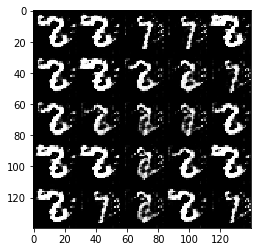


 Epoch 2/2 Step 3400 Discriminator Loss: 1.4275 ...  Generator Loss: 0.7656

 Epoch 2/2 Step 3410 Discriminator Loss: 1.4249 ...  Generator Loss: 0.7274

 Epoch 2/2 Step 3420 Discriminator Loss: 1.4224 ...  Generator Loss: 0.7361

 Epoch 2/2 Step 3430 Discriminator Loss: 1.4906 ...  Generator Loss: 0.6975

 Epoch 2/2 Step 3440 Discriminator Loss: 1.5069 ...  Generator Loss: 0.7201

 Epoch 2/2 Step 3450 Discriminator Loss: 1.3927 ...  Generator Loss: 0.7783

 Epoch 2/2 Step 3460 Discriminator Loss: 1.4247 ...  Generator Loss: 0.7712

 Epoch 2/2 Step 3470 Discriminator Loss: 1.4258 ...  Generator Loss: 0.7552

 Epoch 2/2 Step 3480 Discriminator Loss: 1.5226 ...  Generator Loss: 0.6791

 Epoch 2/2 Step 3490 Discriminator Loss: 1.4002 ...  Generator Loss: 0.7766


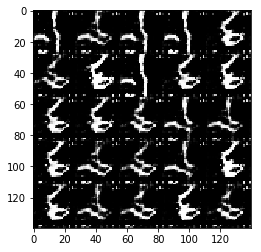


 Epoch 2/2 Step 3500 Discriminator Loss: 1.3722 ...  Generator Loss: 0.7965

 Epoch 2/2 Step 3510 Discriminator Loss: 1.3361 ...  Generator Loss: 0.7672

 Epoch 2/2 Step 3520 Discriminator Loss: 1.3726 ...  Generator Loss: 0.7574

 Epoch 2/2 Step 3530 Discriminator Loss: 1.3915 ...  Generator Loss: 0.7827

 Epoch 2/2 Step 3540 Discriminator Loss: 1.4812 ...  Generator Loss: 0.7295

 Epoch 2/2 Step 3550 Discriminator Loss: 1.5216 ...  Generator Loss: 0.6996

 Epoch 2/2 Step 3560 Discriminator Loss: 1.5255 ...  Generator Loss: 0.6903

 Epoch 2/2 Step 3570 Discriminator Loss: 1.4822 ...  Generator Loss: 0.7197

 Epoch 2/2 Step 3580 Discriminator Loss: 1.5265 ...  Generator Loss: 0.7015

 Epoch 2/2 Step 3590 Discriminator Loss: 1.4684 ...  Generator Loss: 0.7068


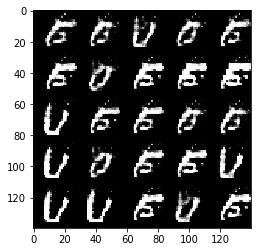


 Epoch 2/2 Step 3600 Discriminator Loss: 1.5317 ...  Generator Loss: 0.7450

 Epoch 2/2 Step 3610 Discriminator Loss: 1.5212 ...  Generator Loss: 0.6792

 Epoch 2/2 Step 3620 Discriminator Loss: 1.5300 ...  Generator Loss: 0.7110

 Epoch 2/2 Step 3630 Discriminator Loss: 1.4737 ...  Generator Loss: 0.7453

 Epoch 2/2 Step 3640 Discriminator Loss: 1.4516 ...  Generator Loss: 0.7725

 Epoch 2/2 Step 3650 Discriminator Loss: 1.4909 ...  Generator Loss: 0.7385

 Epoch 2/2 Step 3660 Discriminator Loss: 1.4155 ...  Generator Loss: 0.7745

 Epoch 2/2 Step 3670 Discriminator Loss: 1.3723 ...  Generator Loss: 0.7824

 Epoch 2/2 Step 3680 Discriminator Loss: 1.4314 ...  Generator Loss: 0.7713

 Epoch 2/2 Step 3690 Discriminator Loss: 1.3525 ...  Generator Loss: 0.8076


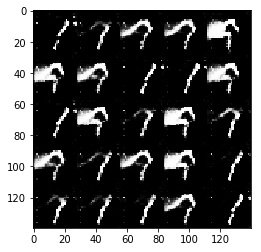


 Epoch 2/2 Step 3700 Discriminator Loss: 1.5370 ...  Generator Loss: 0.6632

 Epoch 2/2 Step 3710 Discriminator Loss: 1.4534 ...  Generator Loss: 0.7496

 Epoch 2/2 Step 3720 Discriminator Loss: 1.4131 ...  Generator Loss: 0.7338

 Epoch 2/2 Step 3730 Discriminator Loss: 1.4880 ...  Generator Loss: 0.7229

 Epoch 2/2 Step 3740 Discriminator Loss: 1.4503 ...  Generator Loss: 0.7994

 Epoch 2/2 Step 3750 Discriminator Loss: 1.4545 ...  Generator Loss: 0.7360

 Epoch 2/2... Discriminator Loss: 1.4545... Generator Loss: 0.7360


In [14]:
batch_size = 32
z_dim = 100
learning_rate = .0002
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.


 Epoch 1/1 Step 10 Discriminator Loss: 5.4790 ...  Generator Loss: 0.0091

 Epoch 1/1 Step 20 Discriminator Loss: 4.6531 ...  Generator Loss: 0.0196

 Epoch 1/1 Step 30 Discriminator Loss: 4.2251 ...  Generator Loss: 0.0280

 Epoch 1/1 Step 40 Discriminator Loss: 4.2829 ...  Generator Loss: 0.0293

 Epoch 1/1 Step 50 Discriminator Loss: 3.8346 ...  Generator Loss: 0.0432

 Epoch 1/1 Step 60 Discriminator Loss: 3.7271 ...  Generator Loss: 0.0443

 Epoch 1/1 Step 70 Discriminator Loss: 3.6331 ...  Generator Loss: 0.0546

 Epoch 1/1 Step 80 Discriminator Loss: 3.2283 ...  Generator Loss: 0.0810

 Epoch 1/1 Step 90 Discriminator Loss: 3.1747 ...  Generator Loss: 0.0979


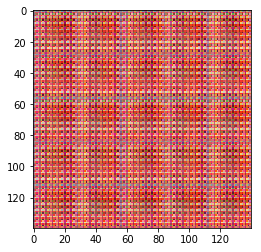


 Epoch 1/1 Step 100 Discriminator Loss: 2.7625 ...  Generator Loss: 0.1420

 Epoch 1/1 Step 110 Discriminator Loss: 2.4894 ...  Generator Loss: 0.1655

 Epoch 1/1 Step 120 Discriminator Loss: 2.9022 ...  Generator Loss: 0.1157

 Epoch 1/1 Step 130 Discriminator Loss: 2.5953 ...  Generator Loss: 0.1910

 Epoch 1/1 Step 140 Discriminator Loss: 2.2635 ...  Generator Loss: 0.2965

 Epoch 1/1 Step 150 Discriminator Loss: 2.3816 ...  Generator Loss: 0.2604

 Epoch 1/1 Step 160 Discriminator Loss: 2.3658 ...  Generator Loss: 0.2418

 Epoch 1/1 Step 170 Discriminator Loss: 2.3384 ...  Generator Loss: 0.2795

 Epoch 1/1 Step 180 Discriminator Loss: 2.5027 ...  Generator Loss: 0.2014

 Epoch 1/1 Step 190 Discriminator Loss: 2.3493 ...  Generator Loss: 0.2445


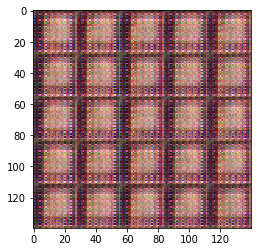


 Epoch 1/1 Step 200 Discriminator Loss: 2.3031 ...  Generator Loss: 0.2455

 Epoch 1/1 Step 210 Discriminator Loss: 2.2769 ...  Generator Loss: 0.3176

 Epoch 1/1 Step 220 Discriminator Loss: 2.0316 ...  Generator Loss: 0.3804

 Epoch 1/1 Step 230 Discriminator Loss: 2.1435 ...  Generator Loss: 0.2853

 Epoch 1/1 Step 240 Discriminator Loss: 2.1381 ...  Generator Loss: 0.3223

 Epoch 1/1 Step 250 Discriminator Loss: 2.2547 ...  Generator Loss: 0.2622

 Epoch 1/1 Step 260 Discriminator Loss: 2.4075 ...  Generator Loss: 0.2179

 Epoch 1/1 Step 270 Discriminator Loss: 2.2970 ...  Generator Loss: 0.2269

 Epoch 1/1 Step 280 Discriminator Loss: 2.3087 ...  Generator Loss: 0.2969

 Epoch 1/1 Step 290 Discriminator Loss: 2.1632 ...  Generator Loss: 0.2544


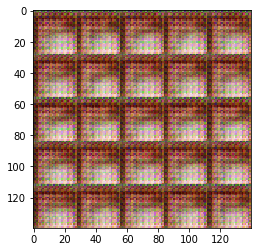


 Epoch 1/1 Step 300 Discriminator Loss: 2.3066 ...  Generator Loss: 0.2560

 Epoch 1/1 Step 310 Discriminator Loss: 2.4065 ...  Generator Loss: 0.2174

 Epoch 1/1 Step 320 Discriminator Loss: 2.1375 ...  Generator Loss: 0.3203

 Epoch 1/1 Step 330 Discriminator Loss: 2.0936 ...  Generator Loss: 0.4294

 Epoch 1/1 Step 340 Discriminator Loss: 2.2572 ...  Generator Loss: 0.2656

 Epoch 1/1 Step 350 Discriminator Loss: 2.0899 ...  Generator Loss: 0.2836

 Epoch 1/1 Step 360 Discriminator Loss: 2.2221 ...  Generator Loss: 0.2684

 Epoch 1/1 Step 370 Discriminator Loss: 2.2689 ...  Generator Loss: 0.2713

 Epoch 1/1 Step 380 Discriminator Loss: 2.2620 ...  Generator Loss: 0.2740

 Epoch 1/1 Step 390 Discriminator Loss: 2.2922 ...  Generator Loss: 0.2387


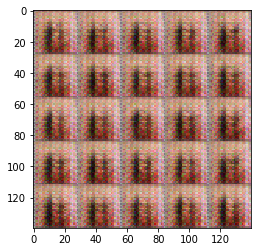


 Epoch 1/1 Step 400 Discriminator Loss: 2.0317 ...  Generator Loss: 0.3279

 Epoch 1/1 Step 410 Discriminator Loss: 2.0612 ...  Generator Loss: 0.2869

 Epoch 1/1 Step 420 Discriminator Loss: 1.9468 ...  Generator Loss: 0.3305

 Epoch 1/1 Step 430 Discriminator Loss: 2.0414 ...  Generator Loss: 0.3142

 Epoch 1/1 Step 440 Discriminator Loss: 1.9679 ...  Generator Loss: 0.3221

 Epoch 1/1 Step 450 Discriminator Loss: 1.7576 ...  Generator Loss: 0.4985

 Epoch 1/1 Step 460 Discriminator Loss: 1.5838 ...  Generator Loss: 0.6410

 Epoch 1/1 Step 470 Discriminator Loss: 1.8722 ...  Generator Loss: 0.3616

 Epoch 1/1 Step 480 Discriminator Loss: 1.9562 ...  Generator Loss: 0.3468

 Epoch 1/1 Step 490 Discriminator Loss: 1.6859 ...  Generator Loss: 0.7533


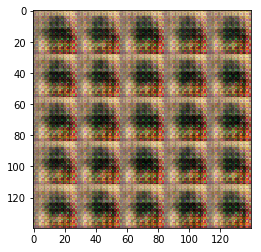


 Epoch 1/1 Step 500 Discriminator Loss: 1.8112 ...  Generator Loss: 0.4265

 Epoch 1/1 Step 510 Discriminator Loss: 1.9602 ...  Generator Loss: 0.3562

 Epoch 1/1 Step 520 Discriminator Loss: 1.9197 ...  Generator Loss: 0.3952

 Epoch 1/1 Step 530 Discriminator Loss: 2.0119 ...  Generator Loss: 0.2770

 Epoch 1/1 Step 540 Discriminator Loss: 2.0034 ...  Generator Loss: 0.4589

 Epoch 1/1 Step 550 Discriminator Loss: 2.0101 ...  Generator Loss: 0.3165

 Epoch 1/1 Step 560 Discriminator Loss: 1.8926 ...  Generator Loss: 0.3690

 Epoch 1/1 Step 570 Discriminator Loss: 1.6553 ...  Generator Loss: 0.4918

 Epoch 1/1 Step 580 Discriminator Loss: 1.9756 ...  Generator Loss: 0.3812

 Epoch 1/1 Step 590 Discriminator Loss: 2.2481 ...  Generator Loss: 0.3860


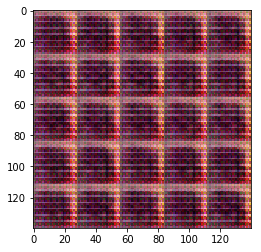


 Epoch 1/1 Step 600 Discriminator Loss: 1.8392 ...  Generator Loss: 0.4182

 Epoch 1/1 Step 610 Discriminator Loss: 1.7051 ...  Generator Loss: 0.4650

 Epoch 1/1 Step 620 Discriminator Loss: 1.8604 ...  Generator Loss: 0.3984

 Epoch 1/1 Step 630 Discriminator Loss: 1.6269 ...  Generator Loss: 0.7604

 Epoch 1/1 Step 640 Discriminator Loss: 1.7412 ...  Generator Loss: 0.4536

 Epoch 1/1 Step 650 Discriminator Loss: 1.5847 ...  Generator Loss: 0.4665

 Epoch 1/1 Step 660 Discriminator Loss: 1.5333 ...  Generator Loss: 0.5990

 Epoch 1/1 Step 670 Discriminator Loss: 1.4197 ...  Generator Loss: 0.7208

 Epoch 1/1 Step 680 Discriminator Loss: 1.5079 ...  Generator Loss: 0.5100

 Epoch 1/1 Step 690 Discriminator Loss: 1.5317 ...  Generator Loss: 0.6122


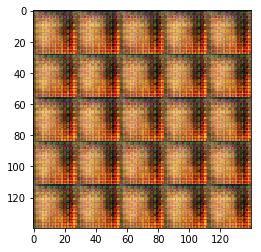


 Epoch 1/1 Step 700 Discriminator Loss: 1.6245 ...  Generator Loss: 0.6635

 Epoch 1/1 Step 710 Discriminator Loss: 1.5614 ...  Generator Loss: 0.6133

 Epoch 1/1 Step 720 Discriminator Loss: 1.6517 ...  Generator Loss: 0.5176

 Epoch 1/1 Step 730 Discriminator Loss: 1.5396 ...  Generator Loss: 0.6338

 Epoch 1/1 Step 740 Discriminator Loss: 1.6362 ...  Generator Loss: 0.6353

 Epoch 1/1 Step 750 Discriminator Loss: 1.6784 ...  Generator Loss: 0.5944

 Epoch 1/1 Step 760 Discriminator Loss: 1.6158 ...  Generator Loss: 0.5190

 Epoch 1/1 Step 770 Discriminator Loss: 1.6200 ...  Generator Loss: 0.4658

 Epoch 1/1 Step 780 Discriminator Loss: 1.5980 ...  Generator Loss: 0.5930

 Epoch 1/1 Step 790 Discriminator Loss: 1.7295 ...  Generator Loss: 0.5949


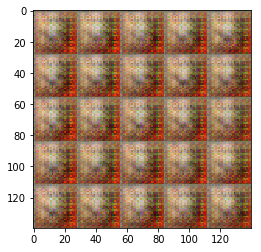


 Epoch 1/1 Step 800 Discriminator Loss: 1.7011 ...  Generator Loss: 0.5471

 Epoch 1/1 Step 810 Discriminator Loss: 1.9910 ...  Generator Loss: 0.3459

 Epoch 1/1 Step 820 Discriminator Loss: 2.0200 ...  Generator Loss: 0.4513

 Epoch 1/1 Step 830 Discriminator Loss: 1.8097 ...  Generator Loss: 0.5099

 Epoch 1/1 Step 840 Discriminator Loss: 1.6441 ...  Generator Loss: 0.5910

 Epoch 1/1 Step 850 Discriminator Loss: 1.5661 ...  Generator Loss: 0.6402

 Epoch 1/1 Step 860 Discriminator Loss: 1.6805 ...  Generator Loss: 0.4691

 Epoch 1/1 Step 870 Discriminator Loss: 1.7194 ...  Generator Loss: 0.5161

 Epoch 1/1 Step 880 Discriminator Loss: 1.6381 ...  Generator Loss: 0.5683

 Epoch 1/1 Step 890 Discriminator Loss: 1.7456 ...  Generator Loss: 0.4826


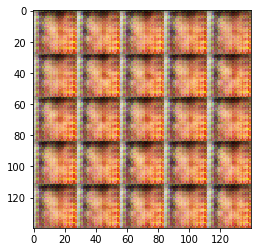


 Epoch 1/1 Step 900 Discriminator Loss: 1.4913 ...  Generator Loss: 0.6562

 Epoch 1/1 Step 910 Discriminator Loss: 1.5650 ...  Generator Loss: 0.6326

 Epoch 1/1 Step 920 Discriminator Loss: 1.7594 ...  Generator Loss: 0.6054

 Epoch 1/1 Step 930 Discriminator Loss: 1.4736 ...  Generator Loss: 0.7112

 Epoch 1/1 Step 940 Discriminator Loss: 1.2884 ...  Generator Loss: 0.6997

 Epoch 1/1 Step 950 Discriminator Loss: 1.6596 ...  Generator Loss: 0.3875

 Epoch 1/1 Step 960 Discriminator Loss: 1.7538 ...  Generator Loss: 0.6845

 Epoch 1/1 Step 970 Discriminator Loss: 1.5593 ...  Generator Loss: 0.6848

 Epoch 1/1 Step 980 Discriminator Loss: 1.6583 ...  Generator Loss: 0.5352

 Epoch 1/1 Step 990 Discriminator Loss: 1.6291 ...  Generator Loss: 0.5809


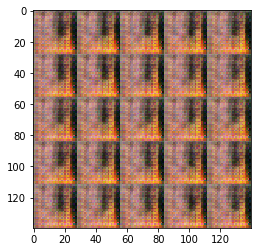


 Epoch 1/1 Step 1000 Discriminator Loss: 1.5542 ...  Generator Loss: 0.5880

 Epoch 1/1 Step 1010 Discriminator Loss: 1.7439 ...  Generator Loss: 0.4830

 Epoch 1/1 Step 1020 Discriminator Loss: 1.6992 ...  Generator Loss: 0.5684

 Epoch 1/1 Step 1030 Discriminator Loss: 1.7938 ...  Generator Loss: 0.4720

 Epoch 1/1 Step 1040 Discriminator Loss: 2.0594 ...  Generator Loss: 0.3361

 Epoch 1/1 Step 1050 Discriminator Loss: 2.4900 ...  Generator Loss: 0.2156

 Epoch 1/1 Step 1060 Discriminator Loss: 2.0431 ...  Generator Loss: 0.3543

 Epoch 1/1 Step 1070 Discriminator Loss: 1.6351 ...  Generator Loss: 0.5624

 Epoch 1/1 Step 1080 Discriminator Loss: 1.4670 ...  Generator Loss: 0.7881

 Epoch 1/1 Step 1090 Discriminator Loss: 1.4062 ...  Generator Loss: 0.6437


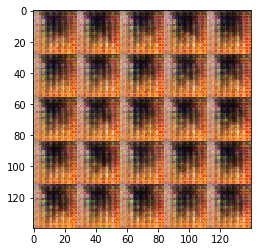


 Epoch 1/1 Step 1100 Discriminator Loss: 1.3979 ...  Generator Loss: 0.7093

 Epoch 1/1 Step 1110 Discriminator Loss: 1.3454 ...  Generator Loss: 0.8572

 Epoch 1/1 Step 1120 Discriminator Loss: 1.3246 ...  Generator Loss: 0.8168

 Epoch 1/1 Step 1130 Discriminator Loss: 1.0698 ...  Generator Loss: 0.8485

 Epoch 1/1 Step 1140 Discriminator Loss: 1.9866 ...  Generator Loss: 0.3038

 Epoch 1/1 Step 1150 Discriminator Loss: 1.9718 ...  Generator Loss: 0.7197

 Epoch 1/1 Step 1160 Discriminator Loss: 1.3928 ...  Generator Loss: 0.8601

 Epoch 1/1 Step 1170 Discriminator Loss: 1.5465 ...  Generator Loss: 0.4891

 Epoch 1/1 Step 1180 Discriminator Loss: 1.6670 ...  Generator Loss: 0.8006

 Epoch 1/1 Step 1190 Discriminator Loss: 1.5937 ...  Generator Loss: 0.5989


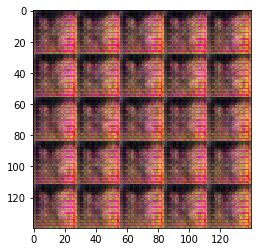


 Epoch 1/1 Step 1200 Discriminator Loss: 1.6108 ...  Generator Loss: 0.5409

 Epoch 1/1 Step 1210 Discriminator Loss: 1.5028 ...  Generator Loss: 0.7664

 Epoch 1/1 Step 1220 Discriminator Loss: 1.3655 ...  Generator Loss: 0.8386

 Epoch 1/1 Step 1230 Discriminator Loss: 1.6353 ...  Generator Loss: 0.5050

 Epoch 1/1 Step 1240 Discriminator Loss: 1.7234 ...  Generator Loss: 0.5912

 Epoch 1/1 Step 1250 Discriminator Loss: 1.6073 ...  Generator Loss: 0.5771

 Epoch 1/1 Step 1260 Discriminator Loss: 1.5540 ...  Generator Loss: 0.5813

 Epoch 1/1 Step 1270 Discriminator Loss: 1.6043 ...  Generator Loss: 0.5269

 Epoch 1/1 Step 1280 Discriminator Loss: 1.3210 ...  Generator Loss: 0.8367

 Epoch 1/1 Step 1290 Discriminator Loss: 1.6842 ...  Generator Loss: 0.4801


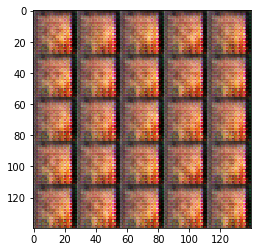


 Epoch 1/1 Step 1300 Discriminator Loss: 1.8119 ...  Generator Loss: 0.6090

 Epoch 1/1 Step 1310 Discriminator Loss: 1.4406 ...  Generator Loss: 0.7052

 Epoch 1/1 Step 1320 Discriminator Loss: 1.5110 ...  Generator Loss: 0.6185

 Epoch 1/1 Step 1330 Discriminator Loss: 1.4969 ...  Generator Loss: 0.8189

 Epoch 1/1 Step 1340 Discriminator Loss: 1.4908 ...  Generator Loss: 0.5964

 Epoch 1/1 Step 1350 Discriminator Loss: 1.5014 ...  Generator Loss: 0.7081

 Epoch 1/1 Step 1360 Discriminator Loss: 1.4521 ...  Generator Loss: 0.6853

 Epoch 1/1 Step 1370 Discriminator Loss: 1.4765 ...  Generator Loss: 0.6001

 Epoch 1/1 Step 1380 Discriminator Loss: 1.4793 ...  Generator Loss: 0.7396

 Epoch 1/1 Step 1390 Discriminator Loss: 1.3445 ...  Generator Loss: 0.7030


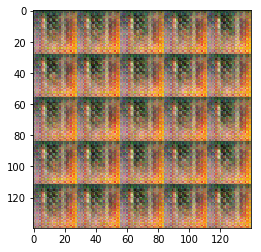


 Epoch 1/1 Step 1400 Discriminator Loss: 1.7883 ...  Generator Loss: 0.4188

 Epoch 1/1 Step 1410 Discriminator Loss: 1.6423 ...  Generator Loss: 0.5673

 Epoch 1/1 Step 1420 Discriminator Loss: 1.4925 ...  Generator Loss: 0.9286

 Epoch 1/1 Step 1430 Discriminator Loss: 1.8310 ...  Generator Loss: 0.3570

 Epoch 1/1 Step 1440 Discriminator Loss: 1.6740 ...  Generator Loss: 0.5870

 Epoch 1/1 Step 1450 Discriminator Loss: 1.5865 ...  Generator Loss: 0.6329

 Epoch 1/1 Step 1460 Discriminator Loss: 1.4848 ...  Generator Loss: 0.6055

 Epoch 1/1 Step 1470 Discriminator Loss: 1.8351 ...  Generator Loss: 0.5436

 Epoch 1/1 Step 1480 Discriminator Loss: 1.6949 ...  Generator Loss: 0.5316

 Epoch 1/1 Step 1490 Discriminator Loss: 1.7903 ...  Generator Loss: 0.4317


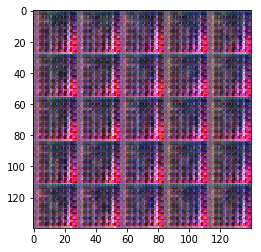


 Epoch 1/1 Step 1500 Discriminator Loss: 2.3739 ...  Generator Loss: 0.2246

 Epoch 1/1 Step 1510 Discriminator Loss: 1.8137 ...  Generator Loss: 0.4103

 Epoch 1/1 Step 1520 Discriminator Loss: 1.5017 ...  Generator Loss: 0.6188

 Epoch 1/1 Step 1530 Discriminator Loss: 1.3242 ...  Generator Loss: 0.7946

 Epoch 1/1 Step 1540 Discriminator Loss: 1.2011 ...  Generator Loss: 0.8074

 Epoch 1/1 Step 1550 Discriminator Loss: 1.4190 ...  Generator Loss: 0.5743

 Epoch 1/1 Step 1560 Discriminator Loss: 1.5300 ...  Generator Loss: 0.7907

 Epoch 1/1 Step 1570 Discriminator Loss: 1.2446 ...  Generator Loss: 0.8418

 Epoch 1/1 Step 1580 Discriminator Loss: 1.1594 ...  Generator Loss: 0.8977

 Epoch 1/1 Step 1590 Discriminator Loss: 1.0103 ...  Generator Loss: 1.1658


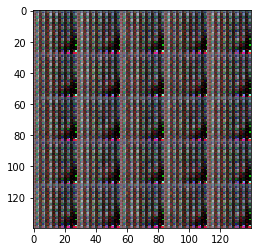


 Epoch 1/1 Step 1600 Discriminator Loss: 1.1728 ...  Generator Loss: 0.8387

 Epoch 1/1 Step 1610 Discriminator Loss: 1.0233 ...  Generator Loss: 1.1881

 Epoch 1/1 Step 1620 Discriminator Loss: 0.9645 ...  Generator Loss: 1.0514

 Epoch 1/1 Step 1630 Discriminator Loss: 0.9414 ...  Generator Loss: 1.0785

 Epoch 1/1 Step 1640 Discriminator Loss: 1.0510 ...  Generator Loss: 0.8703

 Epoch 1/1 Step 1650 Discriminator Loss: 0.8672 ...  Generator Loss: 1.1658

 Epoch 1/1 Step 1660 Discriminator Loss: 0.7723 ...  Generator Loss: 1.2777

 Epoch 1/1 Step 1670 Discriminator Loss: 0.7419 ...  Generator Loss: 1.3565

 Epoch 1/1 Step 1680 Discriminator Loss: 0.6154 ...  Generator Loss: 1.4405

 Epoch 1/1 Step 1690 Discriminator Loss: 0.5644 ...  Generator Loss: 1.6045


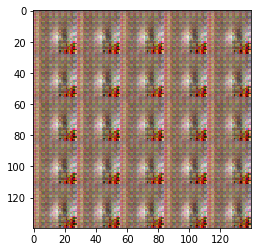


 Epoch 1/1 Step 1700 Discriminator Loss: 0.5822 ...  Generator Loss: 1.5657

 Epoch 1/1 Step 1710 Discriminator Loss: 0.8910 ...  Generator Loss: 1.1846

 Epoch 1/1 Step 1720 Discriminator Loss: 0.5748 ...  Generator Loss: 1.9810

 Epoch 1/1 Step 1730 Discriminator Loss: 0.5670 ...  Generator Loss: 1.9349

 Epoch 1/1 Step 1740 Discriminator Loss: 0.4862 ...  Generator Loss: 1.9670

 Epoch 1/1 Step 1750 Discriminator Loss: 0.7164 ...  Generator Loss: 1.2679

 Epoch 1/1 Step 1760 Discriminator Loss: 0.8175 ...  Generator Loss: 2.2492

 Epoch 1/1 Step 1770 Discriminator Loss: 0.5921 ...  Generator Loss: 2.2261

 Epoch 1/1 Step 1780 Discriminator Loss: 0.6898 ...  Generator Loss: 1.9197

 Epoch 1/1 Step 1790 Discriminator Loss: 0.6265 ...  Generator Loss: 1.7313


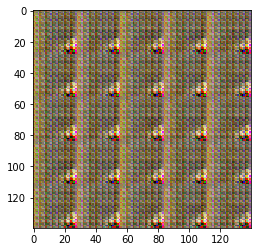


 Epoch 1/1 Step 1800 Discriminator Loss: 0.7601 ...  Generator Loss: 1.6900

 Epoch 1/1 Step 1810 Discriminator Loss: 0.5970 ...  Generator Loss: 1.7494

 Epoch 1/1 Step 1820 Discriminator Loss: 0.5934 ...  Generator Loss: 2.0033

 Epoch 1/1 Step 1830 Discriminator Loss: 0.5163 ...  Generator Loss: 2.0204

 Epoch 1/1 Step 1840 Discriminator Loss: 0.5992 ...  Generator Loss: 1.8209

 Epoch 1/1 Step 1850 Discriminator Loss: 0.7117 ...  Generator Loss: 1.5577

 Epoch 1/1 Step 1860 Discriminator Loss: 0.5498 ...  Generator Loss: 2.2124

 Epoch 1/1 Step 1870 Discriminator Loss: 0.5341 ...  Generator Loss: 2.4415

 Epoch 1/1 Step 1880 Discriminator Loss: 0.4488 ...  Generator Loss: 2.2653

 Epoch 1/1 Step 1890 Discriminator Loss: 0.4182 ...  Generator Loss: 2.5320


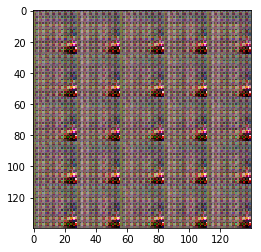


 Epoch 1/1 Step 1900 Discriminator Loss: 0.4662 ...  Generator Loss: 2.4029

 Epoch 1/1 Step 1910 Discriminator Loss: 0.4445 ...  Generator Loss: 2.3666

 Epoch 1/1 Step 1920 Discriminator Loss: 0.4413 ...  Generator Loss: 2.4911

 Epoch 1/1 Step 1930 Discriminator Loss: 0.4199 ...  Generator Loss: 2.5951

 Epoch 1/1 Step 1940 Discriminator Loss: 0.4060 ...  Generator Loss: 2.7085

 Epoch 1/1 Step 1950 Discriminator Loss: 0.5015 ...  Generator Loss: 2.8299

 Epoch 1/1 Step 1960 Discriminator Loss: 0.3870 ...  Generator Loss: 2.8771

 Epoch 1/1 Step 1970 Discriminator Loss: 0.3923 ...  Generator Loss: 2.9241

 Epoch 1/1 Step 1980 Discriminator Loss: 0.4284 ...  Generator Loss: 2.9007

 Epoch 1/1 Step 1990 Discriminator Loss: 0.4892 ...  Generator Loss: 2.0508


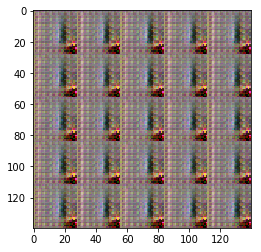


 Epoch 1/1 Step 2000 Discriminator Loss: 0.4319 ...  Generator Loss: 2.4430

 Epoch 1/1 Step 2010 Discriminator Loss: 0.4161 ...  Generator Loss: 2.7815

 Epoch 1/1 Step 2020 Discriminator Loss: 0.3930 ...  Generator Loss: 2.9565

 Epoch 1/1 Step 2030 Discriminator Loss: 0.3928 ...  Generator Loss: 2.9687

 Epoch 1/1 Step 2040 Discriminator Loss: 0.3967 ...  Generator Loss: 2.9795

 Epoch 1/1 Step 2050 Discriminator Loss: 0.4377 ...  Generator Loss: 3.1486

 Epoch 1/1 Step 2060 Discriminator Loss: 0.3766 ...  Generator Loss: 3.2488

 Epoch 1/1 Step 2070 Discriminator Loss: 0.3785 ...  Generator Loss: 3.3896

 Epoch 1/1 Step 2080 Discriminator Loss: 0.4742 ...  Generator Loss: 3.4344

 Epoch 1/1 Step 2090 Discriminator Loss: 0.3833 ...  Generator Loss: 3.3545


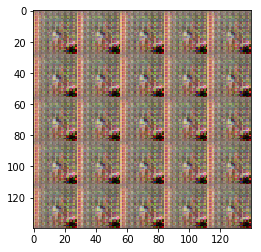


 Epoch 1/1 Step 2100 Discriminator Loss: 0.4011 ...  Generator Loss: 3.3224

 Epoch 1/1 Step 2110 Discriminator Loss: 0.3947 ...  Generator Loss: 3.2883

 Epoch 1/1 Step 2120 Discriminator Loss: 0.3722 ...  Generator Loss: 3.4313

 Epoch 1/1 Step 2130 Discriminator Loss: 0.3959 ...  Generator Loss: 3.5266

 Epoch 1/1 Step 2140 Discriminator Loss: 0.3632 ...  Generator Loss: 3.4974

 Epoch 1/1 Step 2150 Discriminator Loss: 0.3651 ...  Generator Loss: 3.4759

 Epoch 1/1 Step 2160 Discriminator Loss: 0.3640 ...  Generator Loss: 3.5666

 Epoch 1/1 Step 2170 Discriminator Loss: 0.3732 ...  Generator Loss: 3.5681

 Epoch 1/1 Step 2180 Discriminator Loss: 0.4491 ...  Generator Loss: 2.5078

 Epoch 1/1 Step 2190 Discriminator Loss: 0.4333 ...  Generator Loss: 2.8492


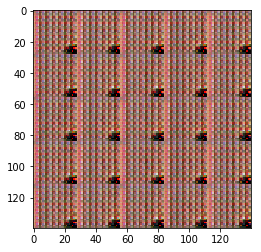


 Epoch 1/1 Step 2200 Discriminator Loss: 0.4421 ...  Generator Loss: 3.1144

 Epoch 1/1 Step 2210 Discriminator Loss: 0.3986 ...  Generator Loss: 3.1909

 Epoch 1/1 Step 2220 Discriminator Loss: 0.4199 ...  Generator Loss: 2.9573

 Epoch 1/1 Step 2230 Discriminator Loss: 0.3788 ...  Generator Loss: 3.3854

 Epoch 1/1 Step 2240 Discriminator Loss: 0.3817 ...  Generator Loss: 3.2394

 Epoch 1/1 Step 2250 Discriminator Loss: 0.4141 ...  Generator Loss: 2.6375

 Epoch 1/1 Step 2260 Discriminator Loss: 0.4077 ...  Generator Loss: 2.9083

 Epoch 1/1 Step 2270 Discriminator Loss: 0.3961 ...  Generator Loss: 2.9327

 Epoch 1/1 Step 2280 Discriminator Loss: 0.3820 ...  Generator Loss: 3.0756

 Epoch 1/1 Step 2290 Discriminator Loss: 0.4045 ...  Generator Loss: 3.1598


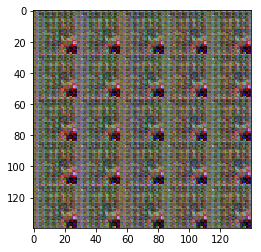


 Epoch 1/1 Step 2300 Discriminator Loss: 0.4322 ...  Generator Loss: 3.3567

 Epoch 1/1 Step 2310 Discriminator Loss: 0.3811 ...  Generator Loss: 3.0758

 Epoch 1/1 Step 2320 Discriminator Loss: 0.3990 ...  Generator Loss: 3.2528

 Epoch 1/1 Step 2330 Discriminator Loss: 0.4083 ...  Generator Loss: 2.7467

 Epoch 1/1 Step 2340 Discriminator Loss: 0.3704 ...  Generator Loss: 3.4559

 Epoch 1/1 Step 2350 Discriminator Loss: 0.3817 ...  Generator Loss: 3.2725

 Epoch 1/1 Step 2360 Discriminator Loss: 0.3910 ...  Generator Loss: 3.0123

 Epoch 1/1 Step 2370 Discriminator Loss: 0.3761 ...  Generator Loss: 3.3359

 Epoch 1/1 Step 2380 Discriminator Loss: 0.3692 ...  Generator Loss: 3.3028

 Epoch 1/1 Step 2390 Discriminator Loss: 0.3713 ...  Generator Loss: 3.5775


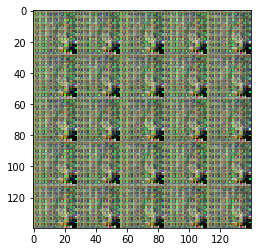


 Epoch 1/1 Step 2400 Discriminator Loss: 0.4072 ...  Generator Loss: 3.6820

 Epoch 1/1 Step 2410 Discriminator Loss: 0.3619 ...  Generator Loss: 3.6529

 Epoch 1/1 Step 2420 Discriminator Loss: 0.3712 ...  Generator Loss: 3.7939

 Epoch 1/1 Step 2430 Discriminator Loss: 0.3866 ...  Generator Loss: 3.7903

 Epoch 1/1 Step 2440 Discriminator Loss: 0.3604 ...  Generator Loss: 3.7737

 Epoch 1/1 Step 2450 Discriminator Loss: 0.3601 ...  Generator Loss: 3.8485

 Epoch 1/1 Step 2460 Discriminator Loss: 0.3663 ...  Generator Loss: 3.9352

 Epoch 1/1 Step 2470 Discriminator Loss: 0.3686 ...  Generator Loss: 3.5425

 Epoch 1/1 Step 2480 Discriminator Loss: 0.4025 ...  Generator Loss: 3.6576

 Epoch 1/1 Step 2490 Discriminator Loss: 0.4160 ...  Generator Loss: 3.5828


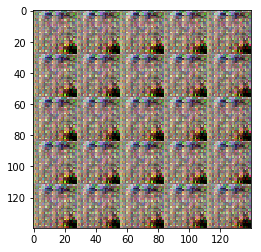


 Epoch 1/1 Step 2500 Discriminator Loss: 0.3843 ...  Generator Loss: 3.4309

 Epoch 1/1 Step 2510 Discriminator Loss: 0.3941 ...  Generator Loss: 3.7190

 Epoch 1/1 Step 2520 Discriminator Loss: 0.3697 ...  Generator Loss: 3.8780

 Epoch 1/1 Step 2530 Discriminator Loss: 0.3580 ...  Generator Loss: 3.9180

 Epoch 1/1 Step 2540 Discriminator Loss: 0.3739 ...  Generator Loss: 3.9001

 Epoch 1/1 Step 2550 Discriminator Loss: 0.4424 ...  Generator Loss: 2.3694

 Epoch 1/1 Step 2560 Discriminator Loss: 0.5280 ...  Generator Loss: 1.9702

 Epoch 1/1 Step 2570 Discriminator Loss: 2.2520 ...  Generator Loss: 0.8573

 Epoch 1/1 Step 2580 Discriminator Loss: 2.6544 ...  Generator Loss: 0.8640

 Epoch 1/1 Step 2590 Discriminator Loss: 1.7637 ...  Generator Loss: 0.8038


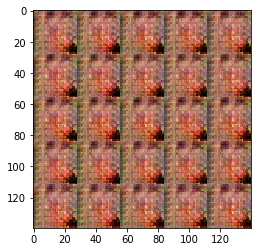


 Epoch 1/1 Step 2600 Discriminator Loss: 1.9064 ...  Generator Loss: 0.7734

 Epoch 1/1 Step 2610 Discriminator Loss: 1.4121 ...  Generator Loss: 0.7557

 Epoch 1/1 Step 2620 Discriminator Loss: 1.8678 ...  Generator Loss: 0.6302

 Epoch 1/1 Step 2630 Discriminator Loss: 1.9823 ...  Generator Loss: 1.0244

 Epoch 1/1 Step 2640 Discriminator Loss: 1.3279 ...  Generator Loss: 0.6921

 Epoch 1/1 Step 2650 Discriminator Loss: 0.7354 ...  Generator Loss: 2.1032

 Epoch 1/1 Step 2660 Discriminator Loss: 0.6717 ...  Generator Loss: 2.0880

 Epoch 1/1 Step 2670 Discriminator Loss: 0.6178 ...  Generator Loss: 2.0786

 Epoch 1/1 Step 2680 Discriminator Loss: 2.3810 ...  Generator Loss: 0.2078

 Epoch 1/1 Step 2690 Discriminator Loss: 1.5392 ...  Generator Loss: 1.1187


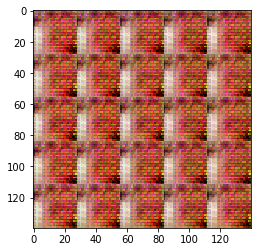


 Epoch 1/1 Step 2700 Discriminator Loss: 2.3391 ...  Generator Loss: 0.3573

 Epoch 1/1 Step 2710 Discriminator Loss: 2.8606 ...  Generator Loss: 0.5266

 Epoch 1/1 Step 2720 Discriminator Loss: 1.9892 ...  Generator Loss: 0.7374

 Epoch 1/1 Step 2730 Discriminator Loss: 1.7167 ...  Generator Loss: 0.7897

 Epoch 1/1 Step 2740 Discriminator Loss: 1.4714 ...  Generator Loss: 0.8002

 Epoch 1/1 Step 2750 Discriminator Loss: 1.8387 ...  Generator Loss: 0.6664

 Epoch 1/1 Step 2760 Discriminator Loss: 1.4524 ...  Generator Loss: 0.8959

 Epoch 1/1 Step 2770 Discriminator Loss: 1.2962 ...  Generator Loss: 0.8093

 Epoch 1/1 Step 2780 Discriminator Loss: 1.3010 ...  Generator Loss: 0.8449

 Epoch 1/1 Step 2790 Discriminator Loss: 1.6380 ...  Generator Loss: 0.9592


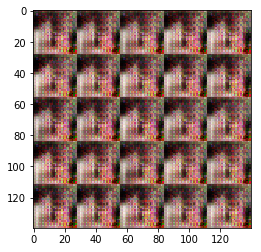


 Epoch 1/1 Step 2800 Discriminator Loss: 1.6061 ...  Generator Loss: 0.5956

 Epoch 1/1 Step 2810 Discriminator Loss: 1.6493 ...  Generator Loss: 0.9809

 Epoch 1/1 Step 2820 Discriminator Loss: 1.2971 ...  Generator Loss: 0.8329

 Epoch 1/1 Step 2830 Discriminator Loss: 1.5183 ...  Generator Loss: 0.7402

 Epoch 1/1 Step 2840 Discriminator Loss: 1.4634 ...  Generator Loss: 0.7390

 Epoch 1/1 Step 2850 Discriminator Loss: 1.6210 ...  Generator Loss: 0.6702

 Epoch 1/1 Step 2860 Discriminator Loss: 1.7345 ...  Generator Loss: 0.5706

 Epoch 1/1 Step 2870 Discriminator Loss: 1.9536 ...  Generator Loss: 0.5585

 Epoch 1/1 Step 2880 Discriminator Loss: 1.6277 ...  Generator Loss: 0.6821

 Epoch 1/1 Step 2890 Discriminator Loss: 1.7984 ...  Generator Loss: 0.4361


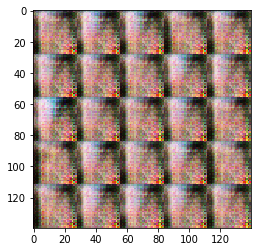


 Epoch 1/1 Step 2900 Discriminator Loss: 1.8850 ...  Generator Loss: 0.8478

 Epoch 1/1 Step 2910 Discriminator Loss: 1.7257 ...  Generator Loss: 0.6104

 Epoch 1/1 Step 2920 Discriminator Loss: 1.5300 ...  Generator Loss: 0.6821

 Epoch 1/1 Step 2930 Discriminator Loss: 1.9545 ...  Generator Loss: 0.6853

 Epoch 1/1 Step 2940 Discriminator Loss: 1.5400 ...  Generator Loss: 0.6232

 Epoch 1/1 Step 2950 Discriminator Loss: 1.5924 ...  Generator Loss: 0.6537

 Epoch 1/1 Step 2960 Discriminator Loss: 1.6010 ...  Generator Loss: 0.7356

 Epoch 1/1 Step 2970 Discriminator Loss: 1.5245 ...  Generator Loss: 0.6810

 Epoch 1/1 Step 2980 Discriminator Loss: 1.3846 ...  Generator Loss: 0.7811

 Epoch 1/1 Step 2990 Discriminator Loss: 1.5247 ...  Generator Loss: 0.7065


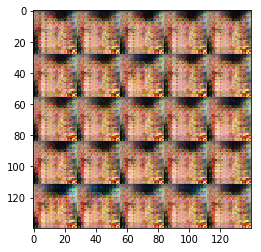


 Epoch 1/1 Step 3000 Discriminator Loss: 1.9085 ...  Generator Loss: 0.9373

 Epoch 1/1 Step 3010 Discriminator Loss: 1.3956 ...  Generator Loss: 0.6409

 Epoch 1/1 Step 3020 Discriminator Loss: 1.2537 ...  Generator Loss: 0.8586

 Epoch 1/1 Step 3030 Discriminator Loss: 1.4612 ...  Generator Loss: 0.8395

 Epoch 1/1 Step 3040 Discriminator Loss: 1.4605 ...  Generator Loss: 0.8826

 Epoch 1/1 Step 3050 Discriminator Loss: 1.2746 ...  Generator Loss: 0.8786

 Epoch 1/1 Step 3060 Discriminator Loss: 1.1406 ...  Generator Loss: 1.2908

 Epoch 1/1 Step 3070 Discriminator Loss: 1.0594 ...  Generator Loss: 1.1075

 Epoch 1/1 Step 3080 Discriminator Loss: 1.6157 ...  Generator Loss: 0.5411

 Epoch 1/1 Step 3090 Discriminator Loss: 1.4008 ...  Generator Loss: 1.0984


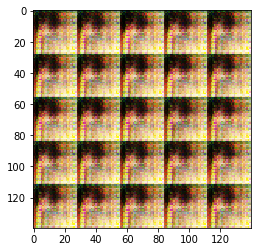


 Epoch 1/1 Step 3100 Discriminator Loss: 1.3587 ...  Generator Loss: 0.7735

 Epoch 1/1 Step 3110 Discriminator Loss: 1.4122 ...  Generator Loss: 1.0481

 Epoch 1/1 Step 3120 Discriminator Loss: 1.1944 ...  Generator Loss: 0.8838

 Epoch 1/1 Step 3130 Discriminator Loss: 1.4767 ...  Generator Loss: 1.0755

 Epoch 1/1 Step 3140 Discriminator Loss: 1.0527 ...  Generator Loss: 1.0241

 Epoch 1/1 Step 3150 Discriminator Loss: 1.2278 ...  Generator Loss: 0.8090

 Epoch 1/1 Step 3160 Discriminator Loss: 1.1900 ...  Generator Loss: 1.0353

 Epoch 1/1 Step 3170 Discriminator Loss: 1.2972 ...  Generator Loss: 0.8618

 Epoch 1/1 Step 3180 Discriminator Loss: 1.5261 ...  Generator Loss: 1.0215

 Epoch 1/1 Step 3190 Discriminator Loss: 1.1753 ...  Generator Loss: 1.0017


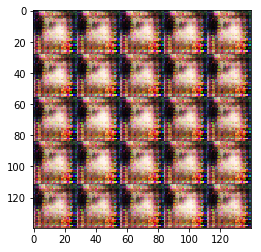


 Epoch 1/1 Step 3200 Discriminator Loss: 1.3690 ...  Generator Loss: 0.8237

 Epoch 1/1 Step 3210 Discriminator Loss: 1.5174 ...  Generator Loss: 0.7834

 Epoch 1/1 Step 3220 Discriminator Loss: 1.5964 ...  Generator Loss: 0.6859

 Epoch 1/1 Step 3230 Discriminator Loss: 1.4509 ...  Generator Loss: 0.7043

 Epoch 1/1 Step 3240 Discriminator Loss: 1.3863 ...  Generator Loss: 0.8732

 Epoch 1/1 Step 3250 Discriminator Loss: 1.5374 ...  Generator Loss: 0.6304

 Epoch 1/1 Step 3260 Discriminator Loss: 1.5039 ...  Generator Loss: 0.6890

 Epoch 1/1 Step 3270 Discriminator Loss: 1.5504 ...  Generator Loss: 0.7490

 Epoch 1/1 Step 3280 Discriminator Loss: 1.6239 ...  Generator Loss: 0.6485

 Epoch 1/1 Step 3290 Discriminator Loss: 1.4103 ...  Generator Loss: 0.8452


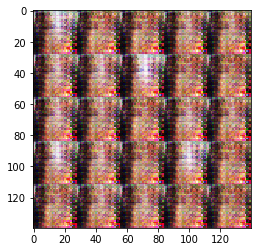


 Epoch 1/1 Step 3300 Discriminator Loss: 1.5225 ...  Generator Loss: 0.7438

 Epoch 1/1 Step 3310 Discriminator Loss: 1.6526 ...  Generator Loss: 0.8426

 Epoch 1/1 Step 3320 Discriminator Loss: 1.5165 ...  Generator Loss: 0.7112

 Epoch 1/1 Step 3330 Discriminator Loss: 1.2969 ...  Generator Loss: 0.8519

 Epoch 1/1 Step 3340 Discriminator Loss: 1.6543 ...  Generator Loss: 0.5616

 Epoch 1/1 Step 3350 Discriminator Loss: 1.5229 ...  Generator Loss: 0.8980

 Epoch 1/1 Step 3360 Discriminator Loss: 1.5323 ...  Generator Loss: 0.8942

 Epoch 1/1 Step 3370 Discriminator Loss: 1.4388 ...  Generator Loss: 0.9228

 Epoch 1/1 Step 3380 Discriminator Loss: 1.3715 ...  Generator Loss: 0.8455

 Epoch 1/1 Step 3390 Discriminator Loss: 1.2111 ...  Generator Loss: 0.9272


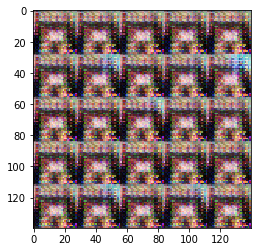


 Epoch 1/1 Step 3400 Discriminator Loss: 1.3385 ...  Generator Loss: 0.8718

 Epoch 1/1 Step 3410 Discriminator Loss: 1.3946 ...  Generator Loss: 0.8955

 Epoch 1/1 Step 3420 Discriminator Loss: 1.1881 ...  Generator Loss: 0.9547

 Epoch 1/1 Step 3430 Discriminator Loss: 1.0473 ...  Generator Loss: 1.0467

 Epoch 1/1 Step 3440 Discriminator Loss: 0.9940 ...  Generator Loss: 1.1072

 Epoch 1/1 Step 3450 Discriminator Loss: 1.1109 ...  Generator Loss: 0.7582

 Epoch 1/1 Step 3460 Discriminator Loss: 1.1812 ...  Generator Loss: 0.9603

 Epoch 1/1 Step 3470 Discriminator Loss: 1.0981 ...  Generator Loss: 1.0563

 Epoch 1/1 Step 3480 Discriminator Loss: 1.5177 ...  Generator Loss: 0.7436

 Epoch 1/1 Step 3490 Discriminator Loss: 1.2491 ...  Generator Loss: 0.8553


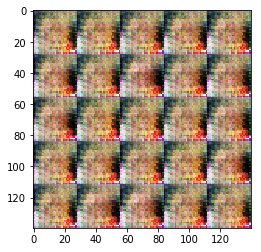


 Epoch 1/1 Step 3500 Discriminator Loss: 1.5294 ...  Generator Loss: 0.6577

 Epoch 1/1 Step 3510 Discriminator Loss: 1.8263 ...  Generator Loss: 0.6817

 Epoch 1/1 Step 3520 Discriminator Loss: 1.9192 ...  Generator Loss: 0.6441

 Epoch 1/1 Step 3530 Discriminator Loss: 1.3983 ...  Generator Loss: 0.8793

 Epoch 1/1 Step 3540 Discriminator Loss: 1.4419 ...  Generator Loss: 0.9125

 Epoch 1/1 Step 3550 Discriminator Loss: 1.5397 ...  Generator Loss: 0.7629

 Epoch 1/1 Step 3560 Discriminator Loss: 1.6367 ...  Generator Loss: 0.7768

 Epoch 1/1 Step 3570 Discriminator Loss: 1.4424 ...  Generator Loss: 0.6590

 Epoch 1/1 Step 3580 Discriminator Loss: 1.4709 ...  Generator Loss: 0.7380

 Epoch 1/1 Step 3590 Discriminator Loss: 1.4563 ...  Generator Loss: 0.7438


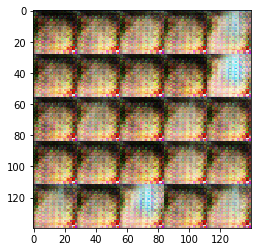


 Epoch 1/1 Step 3600 Discriminator Loss: 1.2430 ...  Generator Loss: 0.8308

 Epoch 1/1 Step 3610 Discriminator Loss: 1.4816 ...  Generator Loss: 0.8271

 Epoch 1/1 Step 3620 Discriminator Loss: 1.4911 ...  Generator Loss: 0.6757

 Epoch 1/1 Step 3630 Discriminator Loss: 1.6299 ...  Generator Loss: 0.4887

 Epoch 1/1 Step 3640 Discriminator Loss: 2.0313 ...  Generator Loss: 0.6206

 Epoch 1/1 Step 3650 Discriminator Loss: 1.7327 ...  Generator Loss: 0.6091

 Epoch 1/1 Step 3660 Discriminator Loss: 1.5952 ...  Generator Loss: 0.5846

 Epoch 1/1 Step 3670 Discriminator Loss: 1.8342 ...  Generator Loss: 0.5831

 Epoch 1/1 Step 3680 Discriminator Loss: 1.5955 ...  Generator Loss: 0.6912

 Epoch 1/1 Step 3690 Discriminator Loss: 1.6764 ...  Generator Loss: 0.6668


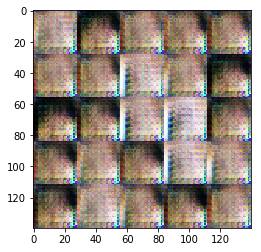


 Epoch 1/1 Step 3700 Discriminator Loss: 1.6024 ...  Generator Loss: 0.5467

 Epoch 1/1 Step 3710 Discriminator Loss: 1.8249 ...  Generator Loss: 0.6100

 Epoch 1/1 Step 3720 Discriminator Loss: 1.6494 ...  Generator Loss: 0.6713

 Epoch 1/1 Step 3730 Discriminator Loss: 1.6456 ...  Generator Loss: 0.6622

 Epoch 1/1 Step 3740 Discriminator Loss: 1.6197 ...  Generator Loss: 0.6323

 Epoch 1/1 Step 3750 Discriminator Loss: 1.6259 ...  Generator Loss: 0.6359

 Epoch 1/1 Step 3760 Discriminator Loss: 1.5836 ...  Generator Loss: 0.6851

 Epoch 1/1 Step 3770 Discriminator Loss: 1.5116 ...  Generator Loss: 0.7399

 Epoch 1/1 Step 3780 Discriminator Loss: 1.5815 ...  Generator Loss: 0.6544

 Epoch 1/1 Step 3790 Discriminator Loss: 1.6275 ...  Generator Loss: 0.7250


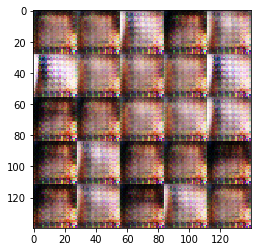


 Epoch 1/1 Step 3800 Discriminator Loss: 1.6448 ...  Generator Loss: 0.6506

 Epoch 1/1 Step 3810 Discriminator Loss: 1.6530 ...  Generator Loss: 0.5891

 Epoch 1/1 Step 3820 Discriminator Loss: 1.6172 ...  Generator Loss: 0.6629

 Epoch 1/1 Step 3830 Discriminator Loss: 1.5559 ...  Generator Loss: 0.6903

 Epoch 1/1 Step 3840 Discriminator Loss: 1.4800 ...  Generator Loss: 0.6931

 Epoch 1/1 Step 3850 Discriminator Loss: 1.5366 ...  Generator Loss: 0.6654

 Epoch 1/1 Step 3860 Discriminator Loss: 1.6554 ...  Generator Loss: 0.6621

 Epoch 1/1 Step 3870 Discriminator Loss: 1.5179 ...  Generator Loss: 0.7124

 Epoch 1/1 Step 3880 Discriminator Loss: 1.6075 ...  Generator Loss: 0.6027

 Epoch 1/1 Step 3890 Discriminator Loss: 1.5567 ...  Generator Loss: 0.7104


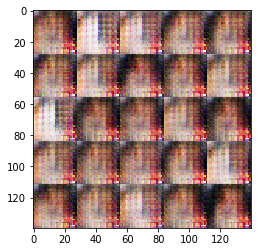


 Epoch 1/1 Step 3900 Discriminator Loss: 1.5617 ...  Generator Loss: 0.6935

 Epoch 1/1 Step 3910 Discriminator Loss: 1.4620 ...  Generator Loss: 0.7657

 Epoch 1/1 Step 3920 Discriminator Loss: 1.4670 ...  Generator Loss: 0.7343

 Epoch 1/1 Step 3930 Discriminator Loss: 1.5725 ...  Generator Loss: 0.6349

 Epoch 1/1 Step 3940 Discriminator Loss: 1.5911 ...  Generator Loss: 0.6519

 Epoch 1/1 Step 3950 Discriminator Loss: 1.5138 ...  Generator Loss: 0.6938

 Epoch 1/1 Step 3960 Discriminator Loss: 1.4428 ...  Generator Loss: 0.7919

 Epoch 1/1 Step 3970 Discriminator Loss: 1.6466 ...  Generator Loss: 0.6058

 Epoch 1/1 Step 3980 Discriminator Loss: 1.5180 ...  Generator Loss: 0.7344

 Epoch 1/1 Step 3990 Discriminator Loss: 1.6046 ...  Generator Loss: 0.7194


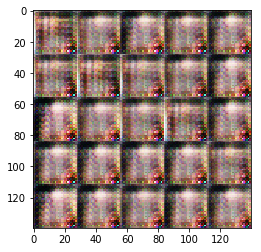


 Epoch 1/1 Step 4000 Discriminator Loss: 1.4674 ...  Generator Loss: 0.7169

 Epoch 1/1 Step 4010 Discriminator Loss: 1.5795 ...  Generator Loss: 0.6035

 Epoch 1/1 Step 4020 Discriminator Loss: 1.5034 ...  Generator Loss: 0.6924

 Epoch 1/1 Step 4030 Discriminator Loss: 1.5338 ...  Generator Loss: 0.6334

 Epoch 1/1 Step 4040 Discriminator Loss: 1.6016 ...  Generator Loss: 0.7141

 Epoch 1/1 Step 4050 Discriminator Loss: 1.6710 ...  Generator Loss: 0.6175

 Epoch 1/1 Step 4060 Discriminator Loss: 1.5140 ...  Generator Loss: 0.6877

 Epoch 1/1 Step 4070 Discriminator Loss: 1.6637 ...  Generator Loss: 0.5844

 Epoch 1/1 Step 4080 Discriminator Loss: 1.6302 ...  Generator Loss: 0.7414

 Epoch 1/1 Step 4090 Discriminator Loss: 1.4247 ...  Generator Loss: 0.7358


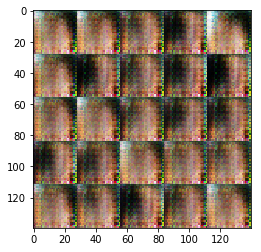


 Epoch 1/1 Step 4100 Discriminator Loss: 1.5147 ...  Generator Loss: 0.7150

 Epoch 1/1 Step 4110 Discriminator Loss: 1.6221 ...  Generator Loss: 0.6690

 Epoch 1/1 Step 4120 Discriminator Loss: 1.4912 ...  Generator Loss: 0.7450

 Epoch 1/1 Step 4130 Discriminator Loss: 1.5125 ...  Generator Loss: 0.7161

 Epoch 1/1 Step 4140 Discriminator Loss: 1.5602 ...  Generator Loss: 0.6607

 Epoch 1/1 Step 4150 Discriminator Loss: 1.5175 ...  Generator Loss: 0.7486

 Epoch 1/1 Step 4160 Discriminator Loss: 1.5058 ...  Generator Loss: 0.7292

 Epoch 1/1 Step 4170 Discriminator Loss: 1.4182 ...  Generator Loss: 0.7417

 Epoch 1/1 Step 4180 Discriminator Loss: 1.4847 ...  Generator Loss: 0.7989

 Epoch 1/1 Step 4190 Discriminator Loss: 1.5242 ...  Generator Loss: 0.6655


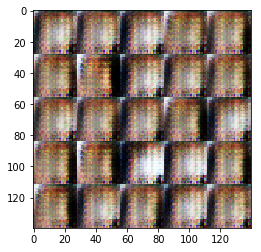


 Epoch 1/1 Step 4200 Discriminator Loss: 1.5328 ...  Generator Loss: 0.6786

 Epoch 1/1 Step 4210 Discriminator Loss: 1.7142 ...  Generator Loss: 0.6103

 Epoch 1/1 Step 4220 Discriminator Loss: 1.6912 ...  Generator Loss: 0.5765

 Epoch 1/1 Step 4230 Discriminator Loss: 1.6153 ...  Generator Loss: 0.7510

 Epoch 1/1 Step 4240 Discriminator Loss: 1.5704 ...  Generator Loss: 0.6832

 Epoch 1/1 Step 4250 Discriminator Loss: 1.6375 ...  Generator Loss: 0.6877

 Epoch 1/1 Step 4260 Discriminator Loss: 1.5661 ...  Generator Loss: 0.7231

 Epoch 1/1 Step 4270 Discriminator Loss: 1.4989 ...  Generator Loss: 0.6940

 Epoch 1/1 Step 4280 Discriminator Loss: 1.5423 ...  Generator Loss: 0.7038

 Epoch 1/1 Step 4290 Discriminator Loss: 1.4901 ...  Generator Loss: 0.7647


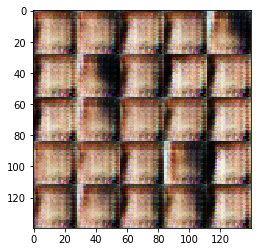


 Epoch 1/1 Step 4300 Discriminator Loss: 1.4788 ...  Generator Loss: 0.7290

 Epoch 1/1 Step 4310 Discriminator Loss: 1.5402 ...  Generator Loss: 0.7126

 Epoch 1/1 Step 4320 Discriminator Loss: 1.6117 ...  Generator Loss: 0.6667

 Epoch 1/1 Step 4330 Discriminator Loss: 1.5918 ...  Generator Loss: 0.6912

 Epoch 1/1 Step 4340 Discriminator Loss: 1.5184 ...  Generator Loss: 0.6927

 Epoch 1/1 Step 4350 Discriminator Loss: 1.5034 ...  Generator Loss: 0.7247

 Epoch 1/1 Step 4360 Discriminator Loss: 1.4879 ...  Generator Loss: 0.7092

 Epoch 1/1 Step 4370 Discriminator Loss: 1.5096 ...  Generator Loss: 0.6770

 Epoch 1/1 Step 4380 Discriminator Loss: 1.5771 ...  Generator Loss: 0.6238

 Epoch 1/1 Step 4390 Discriminator Loss: 1.5789 ...  Generator Loss: 0.6198


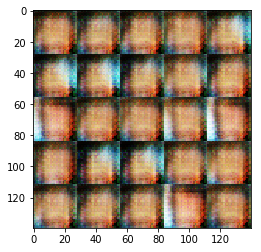


 Epoch 1/1 Step 4400 Discriminator Loss: 1.5697 ...  Generator Loss: 0.7194

 Epoch 1/1 Step 4410 Discriminator Loss: 1.5468 ...  Generator Loss: 0.6853

 Epoch 1/1 Step 4420 Discriminator Loss: 1.5269 ...  Generator Loss: 0.7435

 Epoch 1/1 Step 4430 Discriminator Loss: 1.5008 ...  Generator Loss: 0.6866

 Epoch 1/1 Step 4440 Discriminator Loss: 1.4468 ...  Generator Loss: 0.7381

 Epoch 1/1 Step 4450 Discriminator Loss: 1.5408 ...  Generator Loss: 0.6475

 Epoch 1/1 Step 4460 Discriminator Loss: 1.5492 ...  Generator Loss: 0.6837

 Epoch 1/1 Step 4470 Discriminator Loss: 1.5897 ...  Generator Loss: 0.6808

 Epoch 1/1 Step 4480 Discriminator Loss: 1.5260 ...  Generator Loss: 0.6927

 Epoch 1/1 Step 4490 Discriminator Loss: 1.5102 ...  Generator Loss: 0.6656


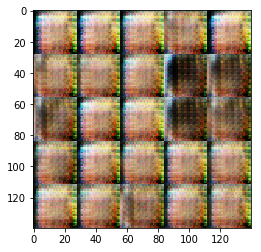


 Epoch 1/1 Step 4500 Discriminator Loss: 1.6279 ...  Generator Loss: 0.6687

 Epoch 1/1 Step 4510 Discriminator Loss: 1.5780 ...  Generator Loss: 0.6296

 Epoch 1/1 Step 4520 Discriminator Loss: 1.6029 ...  Generator Loss: 0.6234

 Epoch 1/1 Step 4530 Discriminator Loss: 1.5590 ...  Generator Loss: 0.7478

 Epoch 1/1 Step 4540 Discriminator Loss: 1.4901 ...  Generator Loss: 0.7296

 Epoch 1/1 Step 4550 Discriminator Loss: 1.4847 ...  Generator Loss: 0.7272

 Epoch 1/1 Step 4560 Discriminator Loss: 1.4163 ...  Generator Loss: 0.7588

 Epoch 1/1 Step 4570 Discriminator Loss: 1.5663 ...  Generator Loss: 0.6577

 Epoch 1/1 Step 4580 Discriminator Loss: 1.5512 ...  Generator Loss: 0.6623

 Epoch 1/1 Step 4590 Discriminator Loss: 1.5137 ...  Generator Loss: 0.7529


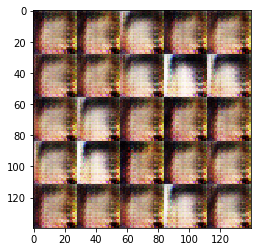


 Epoch 1/1 Step 4600 Discriminator Loss: 1.4844 ...  Generator Loss: 0.7034

 Epoch 1/1 Step 4610 Discriminator Loss: 1.4906 ...  Generator Loss: 0.7127

 Epoch 1/1 Step 4620 Discriminator Loss: 1.4861 ...  Generator Loss: 0.7282

 Epoch 1/1 Step 4630 Discriminator Loss: 1.4828 ...  Generator Loss: 0.6880

 Epoch 1/1 Step 4640 Discriminator Loss: 1.4749 ...  Generator Loss: 0.7831

 Epoch 1/1 Step 4650 Discriminator Loss: 1.3720 ...  Generator Loss: 0.7676

 Epoch 1/1 Step 4660 Discriminator Loss: 1.4880 ...  Generator Loss: 0.6625

 Epoch 1/1 Step 4670 Discriminator Loss: 1.4546 ...  Generator Loss: 0.7119

 Epoch 1/1 Step 4680 Discriminator Loss: 1.4422 ...  Generator Loss: 0.6784

 Epoch 1/1 Step 4690 Discriminator Loss: 1.5527 ...  Generator Loss: 0.6369


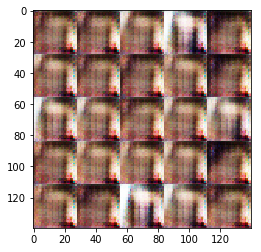


 Epoch 1/1 Step 4700 Discriminator Loss: 1.4524 ...  Generator Loss: 0.7199

 Epoch 1/1 Step 4710 Discriminator Loss: 1.4995 ...  Generator Loss: 0.6604

 Epoch 1/1 Step 4720 Discriminator Loss: 1.6291 ...  Generator Loss: 0.6678

 Epoch 1/1 Step 4730 Discriminator Loss: 1.6354 ...  Generator Loss: 0.6957

 Epoch 1/1 Step 4740 Discriminator Loss: 1.4870 ...  Generator Loss: 0.6800

 Epoch 1/1 Step 4750 Discriminator Loss: 1.5111 ...  Generator Loss: 0.7179

 Epoch 1/1 Step 4760 Discriminator Loss: 1.4926 ...  Generator Loss: 0.7082

 Epoch 1/1 Step 4770 Discriminator Loss: 1.4567 ...  Generator Loss: 0.7448

 Epoch 1/1 Step 4780 Discriminator Loss: 1.4719 ...  Generator Loss: 0.7743

 Epoch 1/1 Step 4790 Discriminator Loss: 1.4944 ...  Generator Loss: 0.7073


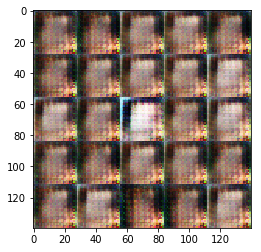


 Epoch 1/1 Step 4800 Discriminator Loss: 1.5860 ...  Generator Loss: 0.7075

 Epoch 1/1 Step 4810 Discriminator Loss: 1.5035 ...  Generator Loss: 0.7112

 Epoch 1/1 Step 4820 Discriminator Loss: 1.5651 ...  Generator Loss: 0.6396

 Epoch 1/1 Step 4830 Discriminator Loss: 1.5269 ...  Generator Loss: 0.7235

 Epoch 1/1 Step 4840 Discriminator Loss: 1.5298 ...  Generator Loss: 0.6777

 Epoch 1/1 Step 4850 Discriminator Loss: 1.5239 ...  Generator Loss: 0.7185

 Epoch 1/1 Step 4860 Discriminator Loss: 1.4261 ...  Generator Loss: 0.7193

 Epoch 1/1 Step 4870 Discriminator Loss: 1.5268 ...  Generator Loss: 0.6918

 Epoch 1/1 Step 4880 Discriminator Loss: 1.4966 ...  Generator Loss: 0.7031

 Epoch 1/1 Step 4890 Discriminator Loss: 1.4612 ...  Generator Loss: 0.6991


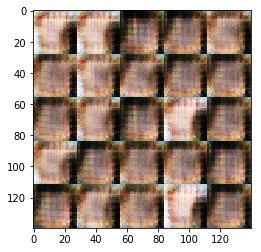


 Epoch 1/1 Step 4900 Discriminator Loss: 1.5156 ...  Generator Loss: 0.6623

 Epoch 1/1 Step 4910 Discriminator Loss: 1.6119 ...  Generator Loss: 0.6785

 Epoch 1/1 Step 4920 Discriminator Loss: 1.5862 ...  Generator Loss: 0.6978

 Epoch 1/1 Step 4930 Discriminator Loss: 1.5305 ...  Generator Loss: 0.7737

 Epoch 1/1 Step 4940 Discriminator Loss: 1.5706 ...  Generator Loss: 0.6539

 Epoch 1/1 Step 4950 Discriminator Loss: 1.4843 ...  Generator Loss: 0.7507

 Epoch 1/1 Step 4960 Discriminator Loss: 1.4848 ...  Generator Loss: 0.7427

 Epoch 1/1 Step 4970 Discriminator Loss: 1.4975 ...  Generator Loss: 0.6318

 Epoch 1/1 Step 4980 Discriminator Loss: 1.4362 ...  Generator Loss: 0.7268

 Epoch 1/1 Step 4990 Discriminator Loss: 1.5845 ...  Generator Loss: 0.6518


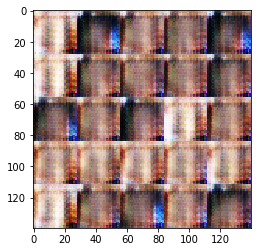


 Epoch 1/1 Step 5000 Discriminator Loss: 1.4831 ...  Generator Loss: 0.7279

 Epoch 1/1 Step 5010 Discriminator Loss: 1.5174 ...  Generator Loss: 0.7154

 Epoch 1/1 Step 5020 Discriminator Loss: 1.5995 ...  Generator Loss: 0.5965

 Epoch 1/1 Step 5030 Discriminator Loss: 1.4607 ...  Generator Loss: 0.7135

 Epoch 1/1 Step 5040 Discriminator Loss: 1.3875 ...  Generator Loss: 0.7875

 Epoch 1/1 Step 5050 Discriminator Loss: 1.4096 ...  Generator Loss: 0.7284

 Epoch 1/1 Step 5060 Discriminator Loss: 1.4455 ...  Generator Loss: 0.7660

 Epoch 1/1 Step 5070 Discriminator Loss: 1.4897 ...  Generator Loss: 0.7039

 Epoch 1/1 Step 5080 Discriminator Loss: 1.5407 ...  Generator Loss: 0.6450

 Epoch 1/1 Step 5090 Discriminator Loss: 1.5026 ...  Generator Loss: 0.7219


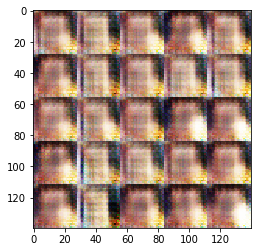


 Epoch 1/1 Step 5100 Discriminator Loss: 1.4759 ...  Generator Loss: 0.7132

 Epoch 1/1 Step 5110 Discriminator Loss: 1.5528 ...  Generator Loss: 0.6892

 Epoch 1/1 Step 5120 Discriminator Loss: 1.5248 ...  Generator Loss: 0.7305

 Epoch 1/1 Step 5130 Discriminator Loss: 1.6159 ...  Generator Loss: 0.5709

 Epoch 1/1 Step 5140 Discriminator Loss: 1.5472 ...  Generator Loss: 0.7222

 Epoch 1/1 Step 5150 Discriminator Loss: 1.4226 ...  Generator Loss: 0.7486

 Epoch 1/1 Step 5160 Discriminator Loss: 1.5049 ...  Generator Loss: 0.6661

 Epoch 1/1 Step 5170 Discriminator Loss: 1.5482 ...  Generator Loss: 0.7322

 Epoch 1/1 Step 5180 Discriminator Loss: 1.6089 ...  Generator Loss: 0.6891

 Epoch 1/1 Step 5190 Discriminator Loss: 1.4872 ...  Generator Loss: 0.7565


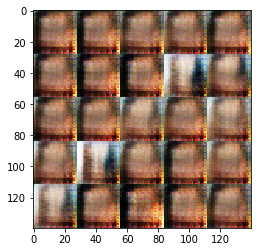


 Epoch 1/1 Step 5200 Discriminator Loss: 1.4445 ...  Generator Loss: 0.7004

 Epoch 1/1 Step 5210 Discriminator Loss: 1.4518 ...  Generator Loss: 0.7334

 Epoch 1/1 Step 5220 Discriminator Loss: 1.5639 ...  Generator Loss: 0.6337

 Epoch 1/1 Step 5230 Discriminator Loss: 1.5020 ...  Generator Loss: 0.6983

 Epoch 1/1 Step 5240 Discriminator Loss: 1.5225 ...  Generator Loss: 0.7790

 Epoch 1/1 Step 5250 Discriminator Loss: 1.4382 ...  Generator Loss: 0.6463

 Epoch 1/1 Step 5260 Discriminator Loss: 1.5694 ...  Generator Loss: 0.7272

 Epoch 1/1 Step 5270 Discriminator Loss: 1.5191 ...  Generator Loss: 0.7056

 Epoch 1/1 Step 5280 Discriminator Loss: 1.4556 ...  Generator Loss: 0.6553

 Epoch 1/1 Step 5290 Discriminator Loss: 1.6436 ...  Generator Loss: 0.6643


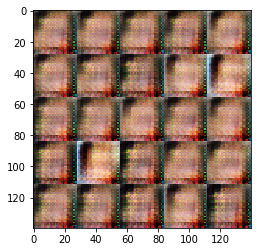


 Epoch 1/1 Step 5300 Discriminator Loss: 1.4092 ...  Generator Loss: 0.7304

 Epoch 1/1 Step 5310 Discriminator Loss: 1.4782 ...  Generator Loss: 0.6662

 Epoch 1/1 Step 5320 Discriminator Loss: 1.5012 ...  Generator Loss: 0.7068

 Epoch 1/1 Step 5330 Discriminator Loss: 1.6115 ...  Generator Loss: 0.6809

 Epoch 1/1 Step 5340 Discriminator Loss: 1.4783 ...  Generator Loss: 0.6579

 Epoch 1/1 Step 5350 Discriminator Loss: 1.4642 ...  Generator Loss: 0.7387

 Epoch 1/1 Step 5360 Discriminator Loss: 1.5099 ...  Generator Loss: 0.6760

 Epoch 1/1 Step 5370 Discriminator Loss: 1.5743 ...  Generator Loss: 0.6535

 Epoch 1/1 Step 5380 Discriminator Loss: 1.4998 ...  Generator Loss: 0.6887

 Epoch 1/1 Step 5390 Discriminator Loss: 1.4942 ...  Generator Loss: 0.7126


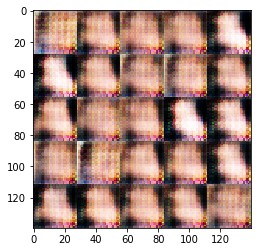


 Epoch 1/1 Step 5400 Discriminator Loss: 1.4579 ...  Generator Loss: 0.7307

 Epoch 1/1 Step 5410 Discriminator Loss: 1.5257 ...  Generator Loss: 0.6740

 Epoch 1/1 Step 5420 Discriminator Loss: 1.5180 ...  Generator Loss: 0.7178

 Epoch 1/1 Step 5430 Discriminator Loss: 1.5299 ...  Generator Loss: 0.6779

 Epoch 1/1 Step 5440 Discriminator Loss: 1.5911 ...  Generator Loss: 0.6615

 Epoch 1/1 Step 5450 Discriminator Loss: 1.5038 ...  Generator Loss: 0.7455

 Epoch 1/1 Step 5460 Discriminator Loss: 1.4700 ...  Generator Loss: 0.7047

 Epoch 1/1 Step 5470 Discriminator Loss: 1.5620 ...  Generator Loss: 0.7004

 Epoch 1/1 Step 5480 Discriminator Loss: 1.5244 ...  Generator Loss: 0.7204

 Epoch 1/1 Step 5490 Discriminator Loss: 1.4706 ...  Generator Loss: 0.6722


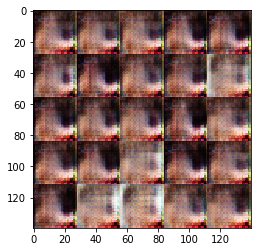


 Epoch 1/1 Step 5500 Discriminator Loss: 1.4440 ...  Generator Loss: 0.7492

 Epoch 1/1 Step 5510 Discriminator Loss: 1.4591 ...  Generator Loss: 0.6684

 Epoch 1/1 Step 5520 Discriminator Loss: 1.4637 ...  Generator Loss: 0.7035

 Epoch 1/1 Step 5530 Discriminator Loss: 1.5011 ...  Generator Loss: 0.6940

 Epoch 1/1 Step 5540 Discriminator Loss: 1.5853 ...  Generator Loss: 0.6685

 Epoch 1/1 Step 5550 Discriminator Loss: 1.5122 ...  Generator Loss: 0.7143

 Epoch 1/1 Step 5560 Discriminator Loss: 1.4736 ...  Generator Loss: 0.6785

 Epoch 1/1 Step 5570 Discriminator Loss: 1.4365 ...  Generator Loss: 0.7085

 Epoch 1/1 Step 5580 Discriminator Loss: 1.4209 ...  Generator Loss: 0.7997

 Epoch 1/1 Step 5590 Discriminator Loss: 1.4797 ...  Generator Loss: 0.6995


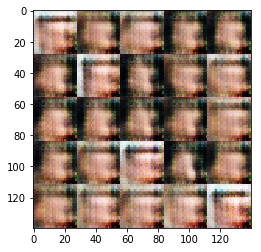


 Epoch 1/1 Step 5600 Discriminator Loss: 1.4879 ...  Generator Loss: 0.6943

 Epoch 1/1 Step 5610 Discriminator Loss: 1.4674 ...  Generator Loss: 0.6942

 Epoch 1/1 Step 5620 Discriminator Loss: 1.5396 ...  Generator Loss: 0.6269

 Epoch 1/1 Step 5630 Discriminator Loss: 1.5002 ...  Generator Loss: 0.6961

 Epoch 1/1 Step 5640 Discriminator Loss: 1.5889 ...  Generator Loss: 0.6914

 Epoch 1/1 Step 5650 Discriminator Loss: 1.4046 ...  Generator Loss: 0.7487

 Epoch 1/1 Step 5660 Discriminator Loss: 1.4590 ...  Generator Loss: 0.7142

 Epoch 1/1 Step 5670 Discriminator Loss: 1.4660 ...  Generator Loss: 0.7484

 Epoch 1/1 Step 5680 Discriminator Loss: 1.5146 ...  Generator Loss: 0.7090

 Epoch 1/1 Step 5690 Discriminator Loss: 1.4703 ...  Generator Loss: 0.6845


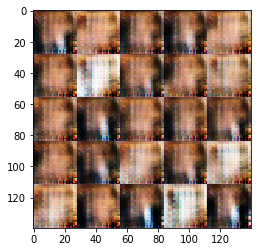


 Epoch 1/1 Step 5700 Discriminator Loss: 1.5571 ...  Generator Loss: 0.7106

 Epoch 1/1 Step 5710 Discriminator Loss: 1.5090 ...  Generator Loss: 0.6569

 Epoch 1/1 Step 5720 Discriminator Loss: 1.4379 ...  Generator Loss: 0.8056

 Epoch 1/1 Step 5730 Discriminator Loss: 1.4693 ...  Generator Loss: 0.7339

 Epoch 1/1 Step 5740 Discriminator Loss: 1.3903 ...  Generator Loss: 0.7347

 Epoch 1/1 Step 5750 Discriminator Loss: 1.5344 ...  Generator Loss: 0.6737

 Epoch 1/1 Step 5760 Discriminator Loss: 1.5721 ...  Generator Loss: 0.6129

 Epoch 1/1 Step 5770 Discriminator Loss: 1.5445 ...  Generator Loss: 0.6717

 Epoch 1/1 Step 5780 Discriminator Loss: 1.5475 ...  Generator Loss: 0.7386

 Epoch 1/1 Step 5790 Discriminator Loss: 1.4861 ...  Generator Loss: 0.7093


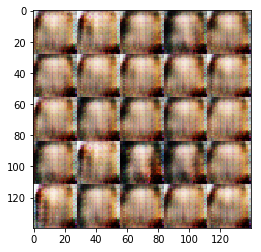


 Epoch 1/1 Step 5800 Discriminator Loss: 1.4834 ...  Generator Loss: 0.7209

 Epoch 1/1 Step 5810 Discriminator Loss: 1.5357 ...  Generator Loss: 0.7075

 Epoch 1/1 Step 5820 Discriminator Loss: 1.4814 ...  Generator Loss: 0.7004

 Epoch 1/1 Step 5830 Discriminator Loss: 1.4612 ...  Generator Loss: 0.7217

 Epoch 1/1 Step 5840 Discriminator Loss: 1.4452 ...  Generator Loss: 0.7258

 Epoch 1/1 Step 5850 Discriminator Loss: 1.4769 ...  Generator Loss: 0.6882

 Epoch 1/1 Step 5860 Discriminator Loss: 1.4027 ...  Generator Loss: 0.7311

 Epoch 1/1 Step 5870 Discriminator Loss: 1.5726 ...  Generator Loss: 0.5998

 Epoch 1/1 Step 5880 Discriminator Loss: 1.4547 ...  Generator Loss: 0.7917

 Epoch 1/1 Step 5890 Discriminator Loss: 1.5193 ...  Generator Loss: 0.7171


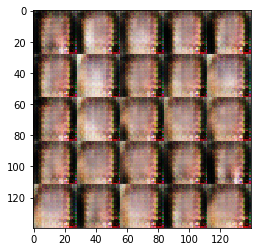


 Epoch 1/1 Step 5900 Discriminator Loss: 1.4693 ...  Generator Loss: 0.6719

 Epoch 1/1 Step 5910 Discriminator Loss: 1.5257 ...  Generator Loss: 0.6982

 Epoch 1/1 Step 5920 Discriminator Loss: 1.5683 ...  Generator Loss: 0.5888

 Epoch 1/1 Step 5930 Discriminator Loss: 1.5133 ...  Generator Loss: 0.7197

 Epoch 1/1 Step 5940 Discriminator Loss: 1.5680 ...  Generator Loss: 0.6968

 Epoch 1/1 Step 5950 Discriminator Loss: 1.4854 ...  Generator Loss: 0.7332

 Epoch 1/1 Step 5960 Discriminator Loss: 1.5147 ...  Generator Loss: 0.6992

 Epoch 1/1 Step 5970 Discriminator Loss: 1.4776 ...  Generator Loss: 0.7263

 Epoch 1/1 Step 5980 Discriminator Loss: 1.4473 ...  Generator Loss: 0.7405

 Epoch 1/1 Step 5990 Discriminator Loss: 1.4605 ...  Generator Loss: 0.7126


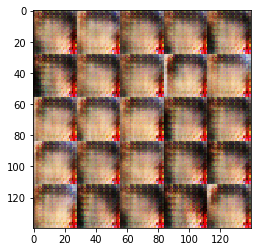


 Epoch 1/1 Step 6000 Discriminator Loss: 1.5734 ...  Generator Loss: 0.6685

 Epoch 1/1 Step 6010 Discriminator Loss: 1.5157 ...  Generator Loss: 0.6466

 Epoch 1/1 Step 6020 Discriminator Loss: 1.5153 ...  Generator Loss: 0.6911

 Epoch 1/1 Step 6030 Discriminator Loss: 1.5278 ...  Generator Loss: 0.7424

 Epoch 1/1 Step 6040 Discriminator Loss: 1.5638 ...  Generator Loss: 0.6889

 Epoch 1/1 Step 6050 Discriminator Loss: 1.5083 ...  Generator Loss: 0.6856

 Epoch 1/1 Step 6060 Discriminator Loss: 1.4983 ...  Generator Loss: 0.6774

 Epoch 1/1 Step 6070 Discriminator Loss: 1.4879 ...  Generator Loss: 0.7656

 Epoch 1/1 Step 6080 Discriminator Loss: 1.4561 ...  Generator Loss: 0.6780

 Epoch 1/1 Step 6090 Discriminator Loss: 1.5131 ...  Generator Loss: 0.6932


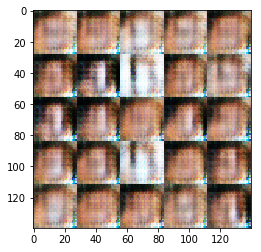


 Epoch 1/1 Step 6100 Discriminator Loss: 1.5319 ...  Generator Loss: 0.6676

 Epoch 1/1 Step 6110 Discriminator Loss: 1.4770 ...  Generator Loss: 0.6985

 Epoch 1/1 Step 6120 Discriminator Loss: 1.4762 ...  Generator Loss: 0.7012

 Epoch 1/1 Step 6130 Discriminator Loss: 1.5114 ...  Generator Loss: 0.7268

 Epoch 1/1 Step 6140 Discriminator Loss: 1.4511 ...  Generator Loss: 0.6912

 Epoch 1/1 Step 6150 Discriminator Loss: 1.5086 ...  Generator Loss: 0.7524

 Epoch 1/1 Step 6160 Discriminator Loss: 1.5626 ...  Generator Loss: 0.6934

 Epoch 1/1 Step 6170 Discriminator Loss: 1.5147 ...  Generator Loss: 0.6595

 Epoch 1/1 Step 6180 Discriminator Loss: 1.4954 ...  Generator Loss: 0.6668

 Epoch 1/1 Step 6190 Discriminator Loss: 1.5329 ...  Generator Loss: 0.7114


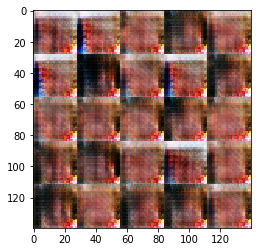


 Epoch 1/1 Step 6200 Discriminator Loss: 1.5253 ...  Generator Loss: 0.6668

 Epoch 1/1 Step 6210 Discriminator Loss: 1.6409 ...  Generator Loss: 0.5937

 Epoch 1/1 Step 6220 Discriminator Loss: 1.5681 ...  Generator Loss: 0.6538

 Epoch 1/1 Step 6230 Discriminator Loss: 1.6243 ...  Generator Loss: 0.5927

 Epoch 1/1 Step 6240 Discriminator Loss: 1.4975 ...  Generator Loss: 0.7196

 Epoch 1/1 Step 6250 Discriminator Loss: 1.5101 ...  Generator Loss: 0.6337

 Epoch 1/1 Step 6260 Discriminator Loss: 1.5125 ...  Generator Loss: 0.7286

 Epoch 1/1 Step 6270 Discriminator Loss: 1.4882 ...  Generator Loss: 0.7736

 Epoch 1/1 Step 6280 Discriminator Loss: 1.4509 ...  Generator Loss: 0.7298

 Epoch 1/1 Step 6290 Discriminator Loss: 1.5260 ...  Generator Loss: 0.7298


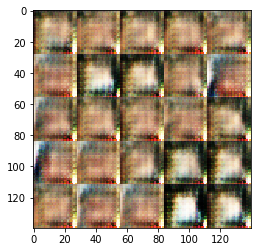


 Epoch 1/1 Step 6300 Discriminator Loss: 1.4863 ...  Generator Loss: 0.6893

 Epoch 1/1 Step 6310 Discriminator Loss: 1.4187 ...  Generator Loss: 0.7626

 Epoch 1/1 Step 6320 Discriminator Loss: 1.5270 ...  Generator Loss: 0.6804

 Epoch 1/1 Step 6330 Discriminator Loss: 1.4170 ...  Generator Loss: 0.7635

 Epoch 1/1 Step 6340 Discriminator Loss: 1.4388 ...  Generator Loss: 0.6992

 Epoch 1/1 Step 6350 Discriminator Loss: 1.5058 ...  Generator Loss: 0.6941

 Epoch 1/1 Step 6360 Discriminator Loss: 1.4613 ...  Generator Loss: 0.7572

 Epoch 1/1 Step 6370 Discriminator Loss: 1.4209 ...  Generator Loss: 0.7179

 Epoch 1/1 Step 6380 Discriminator Loss: 1.4680 ...  Generator Loss: 0.7106

 Epoch 1/1 Step 6390 Discriminator Loss: 1.4789 ...  Generator Loss: 0.6789


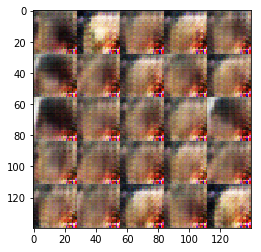


 Epoch 1/1 Step 6400 Discriminator Loss: 1.4608 ...  Generator Loss: 0.7092

 Epoch 1/1 Step 6410 Discriminator Loss: 1.4355 ...  Generator Loss: 0.7486

 Epoch 1/1 Step 6420 Discriminator Loss: 1.4950 ...  Generator Loss: 0.6749

 Epoch 1/1 Step 6430 Discriminator Loss: 1.4993 ...  Generator Loss: 0.7564

 Epoch 1/1 Step 6440 Discriminator Loss: 1.4773 ...  Generator Loss: 0.7054

 Epoch 1/1 Step 6450 Discriminator Loss: 1.4315 ...  Generator Loss: 0.7230

 Epoch 1/1 Step 6460 Discriminator Loss: 1.6726 ...  Generator Loss: 0.6476

 Epoch 1/1 Step 6470 Discriminator Loss: 1.6309 ...  Generator Loss: 0.6160

 Epoch 1/1 Step 6480 Discriminator Loss: 1.5751 ...  Generator Loss: 0.5880

 Epoch 1/1 Step 6490 Discriminator Loss: 1.6216 ...  Generator Loss: 0.7092


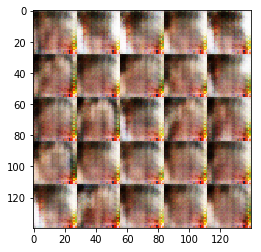


 Epoch 1/1 Step 6500 Discriminator Loss: 1.5321 ...  Generator Loss: 0.6698

 Epoch 1/1 Step 6510 Discriminator Loss: 1.4864 ...  Generator Loss: 0.6598

 Epoch 1/1 Step 6520 Discriminator Loss: 1.4987 ...  Generator Loss: 0.7868

 Epoch 1/1 Step 6530 Discriminator Loss: 1.5414 ...  Generator Loss: 0.6627

 Epoch 1/1 Step 6540 Discriminator Loss: 1.4896 ...  Generator Loss: 0.6848

 Epoch 1/1 Step 6550 Discriminator Loss: 1.4743 ...  Generator Loss: 0.6831

 Epoch 1/1 Step 6560 Discriminator Loss: 1.4263 ...  Generator Loss: 0.6755

 Epoch 1/1 Step 6570 Discriminator Loss: 1.5105 ...  Generator Loss: 0.7433

 Epoch 1/1 Step 6580 Discriminator Loss: 1.5140 ...  Generator Loss: 0.7104

 Epoch 1/1 Step 6590 Discriminator Loss: 1.5372 ...  Generator Loss: 0.5904


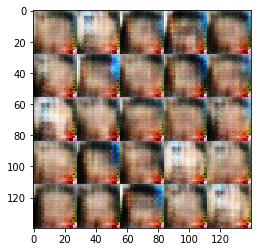


 Epoch 1/1 Step 6600 Discriminator Loss: 1.5620 ...  Generator Loss: 0.6917

 Epoch 1/1 Step 6610 Discriminator Loss: 1.4673 ...  Generator Loss: 0.6875

 Epoch 1/1 Step 6620 Discriminator Loss: 1.5794 ...  Generator Loss: 0.6703

 Epoch 1/1 Step 6630 Discriminator Loss: 1.5303 ...  Generator Loss: 0.7347

 Epoch 1/1 Step 6640 Discriminator Loss: 1.5246 ...  Generator Loss: 0.6645

 Epoch 1/1 Step 6650 Discriminator Loss: 1.4810 ...  Generator Loss: 0.6806

 Epoch 1/1 Step 6660 Discriminator Loss: 1.5266 ...  Generator Loss: 0.6969

 Epoch 1/1 Step 6670 Discriminator Loss: 1.5350 ...  Generator Loss: 0.6732

 Epoch 1/1 Step 6680 Discriminator Loss: 1.4756 ...  Generator Loss: 0.7074

 Epoch 1/1 Step 6690 Discriminator Loss: 1.4337 ...  Generator Loss: 0.7378


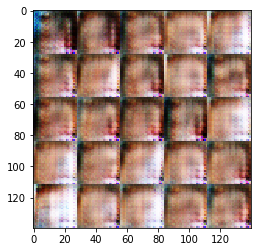


 Epoch 1/1 Step 6700 Discriminator Loss: 1.4583 ...  Generator Loss: 0.7053

 Epoch 1/1 Step 6710 Discriminator Loss: 1.4678 ...  Generator Loss: 0.7523

 Epoch 1/1 Step 6720 Discriminator Loss: 1.4878 ...  Generator Loss: 0.6668

 Epoch 1/1 Step 6730 Discriminator Loss: 1.4628 ...  Generator Loss: 0.6967

 Epoch 1/1 Step 6740 Discriminator Loss: 1.4838 ...  Generator Loss: 0.7105

 Epoch 1/1 Step 6750 Discriminator Loss: 1.5182 ...  Generator Loss: 0.6761

 Epoch 1/1 Step 6760 Discriminator Loss: 1.4658 ...  Generator Loss: 0.6936

 Epoch 1/1 Step 6770 Discriminator Loss: 1.4840 ...  Generator Loss: 0.7045

 Epoch 1/1 Step 6780 Discriminator Loss: 1.5208 ...  Generator Loss: 0.7154

 Epoch 1/1 Step 6790 Discriminator Loss: 1.4788 ...  Generator Loss: 0.7033


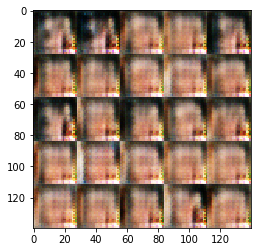


 Epoch 1/1 Step 6800 Discriminator Loss: 1.4853 ...  Generator Loss: 0.7528

 Epoch 1/1 Step 6810 Discriminator Loss: 1.5095 ...  Generator Loss: 0.6183

 Epoch 1/1 Step 6820 Discriminator Loss: 1.4944 ...  Generator Loss: 0.7272

 Epoch 1/1 Step 6830 Discriminator Loss: 1.5057 ...  Generator Loss: 0.6619

 Epoch 1/1 Step 6840 Discriminator Loss: 1.4572 ...  Generator Loss: 0.7015

 Epoch 1/1 Step 6850 Discriminator Loss: 1.3487 ...  Generator Loss: 0.7783

 Epoch 1/1 Step 6860 Discriminator Loss: 1.4820 ...  Generator Loss: 0.6664

 Epoch 1/1 Step 6870 Discriminator Loss: 1.4795 ...  Generator Loss: 0.7226

 Epoch 1/1 Step 6880 Discriminator Loss: 1.5584 ...  Generator Loss: 0.6391

 Epoch 1/1 Step 6890 Discriminator Loss: 1.5358 ...  Generator Loss: 0.6480


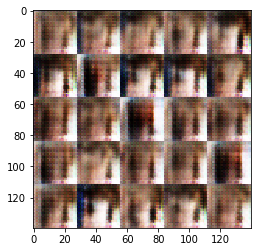


 Epoch 1/1 Step 6900 Discriminator Loss: 1.5402 ...  Generator Loss: 0.6843

 Epoch 1/1 Step 6910 Discriminator Loss: 1.4927 ...  Generator Loss: 0.6231

 Epoch 1/1 Step 6920 Discriminator Loss: 1.4825 ...  Generator Loss: 0.6746

 Epoch 1/1 Step 6930 Discriminator Loss: 1.5282 ...  Generator Loss: 0.7006

 Epoch 1/1 Step 6940 Discriminator Loss: 1.4817 ...  Generator Loss: 0.7061

 Epoch 1/1 Step 6950 Discriminator Loss: 1.4463 ...  Generator Loss: 0.7781

 Epoch 1/1 Step 6960 Discriminator Loss: 1.4334 ...  Generator Loss: 0.7263

 Epoch 1/1 Step 6970 Discriminator Loss: 1.6194 ...  Generator Loss: 0.6850

 Epoch 1/1 Step 6980 Discriminator Loss: 1.4751 ...  Generator Loss: 0.7109

 Epoch 1/1 Step 6990 Discriminator Loss: 1.4422 ...  Generator Loss: 0.7254


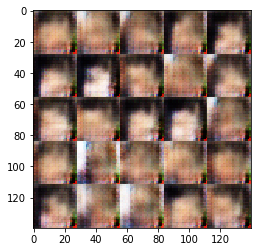


 Epoch 1/1 Step 7000 Discriminator Loss: 1.4523 ...  Generator Loss: 0.7583

 Epoch 1/1 Step 7010 Discriminator Loss: 1.4454 ...  Generator Loss: 0.6689

 Epoch 1/1 Step 7020 Discriminator Loss: 1.4683 ...  Generator Loss: 0.7375

 Epoch 1/1 Step 7030 Discriminator Loss: 1.4808 ...  Generator Loss: 0.6885

 Epoch 1/1 Step 7040 Discriminator Loss: 1.6545 ...  Generator Loss: 0.5778

 Epoch 1/1 Step 7050 Discriminator Loss: 1.5287 ...  Generator Loss: 0.7392

 Epoch 1/1 Step 7060 Discriminator Loss: 1.5673 ...  Generator Loss: 0.6313

 Epoch 1/1 Step 7070 Discriminator Loss: 1.4722 ...  Generator Loss: 0.7040

 Epoch 1/1 Step 7080 Discriminator Loss: 1.4096 ...  Generator Loss: 0.7603

 Epoch 1/1 Step 7090 Discriminator Loss: 1.5812 ...  Generator Loss: 0.6105


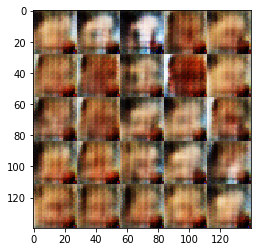


 Epoch 1/1 Step 7100 Discriminator Loss: 1.6156 ...  Generator Loss: 0.6405

 Epoch 1/1 Step 7110 Discriminator Loss: 1.5481 ...  Generator Loss: 0.6622

 Epoch 1/1 Step 7120 Discriminator Loss: 1.4948 ...  Generator Loss: 0.6470

 Epoch 1/1 Step 7130 Discriminator Loss: 1.5133 ...  Generator Loss: 0.6817

 Epoch 1/1 Step 7140 Discriminator Loss: 1.4718 ...  Generator Loss: 0.7678

 Epoch 1/1 Step 7150 Discriminator Loss: 1.4874 ...  Generator Loss: 0.6602

 Epoch 1/1 Step 7160 Discriminator Loss: 1.4164 ...  Generator Loss: 0.7053

 Epoch 1/1 Step 7170 Discriminator Loss: 1.4886 ...  Generator Loss: 0.7047

 Epoch 1/1 Step 7180 Discriminator Loss: 1.5375 ...  Generator Loss: 0.6652

 Epoch 1/1 Step 7190 Discriminator Loss: 1.4924 ...  Generator Loss: 0.6526


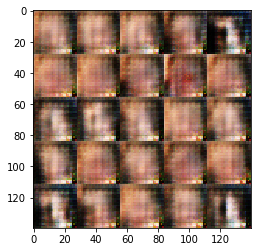


 Epoch 1/1 Step 7200 Discriminator Loss: 1.4234 ...  Generator Loss: 0.7391

 Epoch 1/1 Step 7210 Discriminator Loss: 1.4840 ...  Generator Loss: 0.6615

 Epoch 1/1 Step 7220 Discriminator Loss: 1.4697 ...  Generator Loss: 0.7438

 Epoch 1/1 Step 7230 Discriminator Loss: 1.4924 ...  Generator Loss: 0.6928

 Epoch 1/1 Step 7240 Discriminator Loss: 1.4675 ...  Generator Loss: 0.6928

 Epoch 1/1 Step 7250 Discriminator Loss: 1.4474 ...  Generator Loss: 0.7774

 Epoch 1/1 Step 7260 Discriminator Loss: 1.5152 ...  Generator Loss: 0.6881

 Epoch 1/1 Step 7270 Discriminator Loss: 1.5175 ...  Generator Loss: 0.6582

 Epoch 1/1 Step 7280 Discriminator Loss: 1.4210 ...  Generator Loss: 0.7789

 Epoch 1/1 Step 7290 Discriminator Loss: 1.5334 ...  Generator Loss: 0.6605


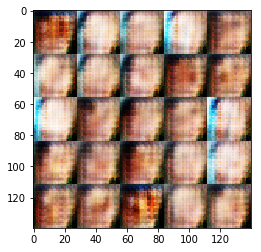


 Epoch 1/1 Step 7300 Discriminator Loss: 1.4914 ...  Generator Loss: 0.7375

 Epoch 1/1 Step 7310 Discriminator Loss: 1.4674 ...  Generator Loss: 0.7238

 Epoch 1/1 Step 7320 Discriminator Loss: 1.4294 ...  Generator Loss: 0.7470

 Epoch 1/1 Step 7330 Discriminator Loss: 1.5881 ...  Generator Loss: 0.6633

 Epoch 1/1 Step 7340 Discriminator Loss: 1.4576 ...  Generator Loss: 0.7006

 Epoch 1/1 Step 7350 Discriminator Loss: 1.4765 ...  Generator Loss: 0.7127

 Epoch 1/1 Step 7360 Discriminator Loss: 1.5605 ...  Generator Loss: 0.6829

 Epoch 1/1 Step 7370 Discriminator Loss: 1.5048 ...  Generator Loss: 0.6351

 Epoch 1/1 Step 7380 Discriminator Loss: 1.5361 ...  Generator Loss: 0.7076

 Epoch 1/1 Step 7390 Discriminator Loss: 1.4489 ...  Generator Loss: 0.6913


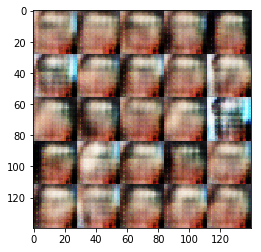


 Epoch 1/1 Step 7400 Discriminator Loss: 1.5688 ...  Generator Loss: 0.5774

 Epoch 1/1 Step 7410 Discriminator Loss: 1.5945 ...  Generator Loss: 0.7881

 Epoch 1/1 Step 7420 Discriminator Loss: 1.4316 ...  Generator Loss: 0.6525

 Epoch 1/1 Step 7430 Discriminator Loss: 1.5255 ...  Generator Loss: 0.6540

 Epoch 1/1 Step 7440 Discriminator Loss: 1.7231 ...  Generator Loss: 0.6104

 Epoch 1/1 Step 7450 Discriminator Loss: 1.5490 ...  Generator Loss: 0.6497

 Epoch 1/1 Step 7460 Discriminator Loss: 1.5097 ...  Generator Loss: 0.7165

 Epoch 1/1 Step 7470 Discriminator Loss: 1.4581 ...  Generator Loss: 0.7131

 Epoch 1/1 Step 7480 Discriminator Loss: 1.4716 ...  Generator Loss: 0.7242

 Epoch 1/1 Step 7490 Discriminator Loss: 1.5555 ...  Generator Loss: 0.6566


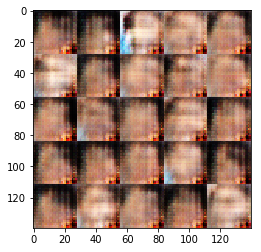


 Epoch 1/1 Step 7500 Discriminator Loss: 1.5216 ...  Generator Loss: 0.6913

 Epoch 1/1 Step 7510 Discriminator Loss: 1.4836 ...  Generator Loss: 0.7242

 Epoch 1/1 Step 7520 Discriminator Loss: 1.4969 ...  Generator Loss: 0.7307

 Epoch 1/1 Step 7530 Discriminator Loss: 1.4810 ...  Generator Loss: 0.6625

 Epoch 1/1 Step 7540 Discriminator Loss: 1.4692 ...  Generator Loss: 0.7116

 Epoch 1/1 Step 7550 Discriminator Loss: 1.4830 ...  Generator Loss: 0.6763

 Epoch 1/1 Step 7560 Discriminator Loss: 1.5277 ...  Generator Loss: 0.7229

 Epoch 1/1 Step 7570 Discriminator Loss: 1.4907 ...  Generator Loss: 0.7736

 Epoch 1/1 Step 7580 Discriminator Loss: 1.4386 ...  Generator Loss: 0.6936

 Epoch 1/1 Step 7590 Discriminator Loss: 1.4655 ...  Generator Loss: 0.7130


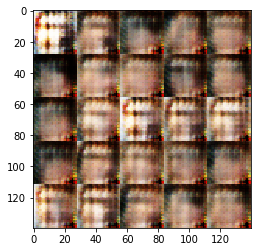


 Epoch 1/1 Step 7600 Discriminator Loss: 1.4600 ...  Generator Loss: 0.6693

 Epoch 1/1 Step 7610 Discriminator Loss: 1.5049 ...  Generator Loss: 0.6751

 Epoch 1/1 Step 7620 Discriminator Loss: 1.5204 ...  Generator Loss: 0.6646

 Epoch 1/1 Step 7630 Discriminator Loss: 1.4549 ...  Generator Loss: 0.6808

 Epoch 1/1 Step 7640 Discriminator Loss: 1.5158 ...  Generator Loss: 0.6827

 Epoch 1/1 Step 7650 Discriminator Loss: 1.5316 ...  Generator Loss: 0.6752

 Epoch 1/1 Step 7660 Discriminator Loss: 1.4944 ...  Generator Loss: 0.7093

 Epoch 1/1 Step 7670 Discriminator Loss: 1.4720 ...  Generator Loss: 0.7165

 Epoch 1/1 Step 7680 Discriminator Loss: 1.5215 ...  Generator Loss: 0.6451

 Epoch 1/1 Step 7690 Discriminator Loss: 1.5364 ...  Generator Loss: 0.7296


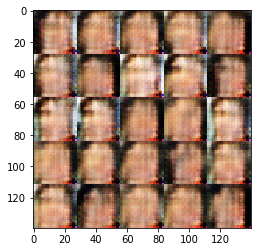


 Epoch 1/1 Step 7700 Discriminator Loss: 1.4792 ...  Generator Loss: 0.7395

 Epoch 1/1 Step 7710 Discriminator Loss: 1.5168 ...  Generator Loss: 0.6855

 Epoch 1/1 Step 7720 Discriminator Loss: 1.5219 ...  Generator Loss: 0.6933

 Epoch 1/1 Step 7730 Discriminator Loss: 1.5036 ...  Generator Loss: 0.6828

 Epoch 1/1 Step 7740 Discriminator Loss: 1.4724 ...  Generator Loss: 0.7414

 Epoch 1/1 Step 7750 Discriminator Loss: 1.5215 ...  Generator Loss: 0.6855

 Epoch 1/1 Step 7760 Discriminator Loss: 1.4856 ...  Generator Loss: 0.6553

 Epoch 1/1 Step 7770 Discriminator Loss: 1.5096 ...  Generator Loss: 0.6779

 Epoch 1/1 Step 7780 Discriminator Loss: 1.4883 ...  Generator Loss: 0.6905

 Epoch 1/1 Step 7790 Discriminator Loss: 1.5326 ...  Generator Loss: 0.6650


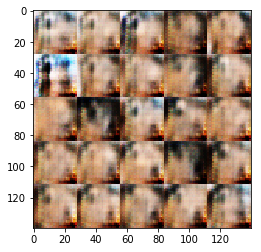


 Epoch 1/1 Step 7800 Discriminator Loss: 1.5792 ...  Generator Loss: 0.6686

 Epoch 1/1 Step 7810 Discriminator Loss: 1.5791 ...  Generator Loss: 0.6338

 Epoch 1/1 Step 7820 Discriminator Loss: 1.4872 ...  Generator Loss: 0.7284

 Epoch 1/1 Step 7830 Discriminator Loss: 1.5076 ...  Generator Loss: 0.6870

 Epoch 1/1 Step 7840 Discriminator Loss: 1.4496 ...  Generator Loss: 0.7406

 Epoch 1/1 Step 7850 Discriminator Loss: 1.4788 ...  Generator Loss: 0.6764

 Epoch 1/1 Step 7860 Discriminator Loss: 1.5768 ...  Generator Loss: 0.6499

 Epoch 1/1 Step 7870 Discriminator Loss: 1.5833 ...  Generator Loss: 0.6693

 Epoch 1/1 Step 7880 Discriminator Loss: 1.5623 ...  Generator Loss: 0.6642

 Epoch 1/1 Step 7890 Discriminator Loss: 1.5041 ...  Generator Loss: 0.6719


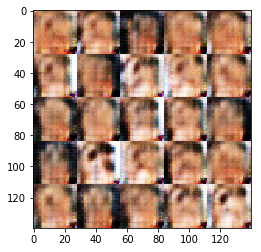


 Epoch 1/1 Step 7900 Discriminator Loss: 1.4521 ...  Generator Loss: 0.7587

 Epoch 1/1 Step 7910 Discriminator Loss: 1.4949 ...  Generator Loss: 0.6869

 Epoch 1/1 Step 7920 Discriminator Loss: 1.4871 ...  Generator Loss: 0.6758

 Epoch 1/1 Step 7930 Discriminator Loss: 1.5718 ...  Generator Loss: 0.6544

 Epoch 1/1 Step 7940 Discriminator Loss: 1.5282 ...  Generator Loss: 0.6667

 Epoch 1/1 Step 7950 Discriminator Loss: 1.5210 ...  Generator Loss: 0.6322

 Epoch 1/1 Step 7960 Discriminator Loss: 1.4959 ...  Generator Loss: 0.6928

 Epoch 1/1 Step 7970 Discriminator Loss: 1.4688 ...  Generator Loss: 0.6892

 Epoch 1/1 Step 7980 Discriminator Loss: 1.5004 ...  Generator Loss: 0.6492

 Epoch 1/1 Step 7990 Discriminator Loss: 1.4296 ...  Generator Loss: 0.7262


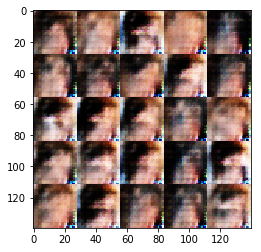


 Epoch 1/1 Step 8000 Discriminator Loss: 1.5244 ...  Generator Loss: 0.6868

 Epoch 1/1 Step 8010 Discriminator Loss: 1.5397 ...  Generator Loss: 0.6421

 Epoch 1/1 Step 8020 Discriminator Loss: 1.4879 ...  Generator Loss: 0.6974

 Epoch 1/1 Step 8030 Discriminator Loss: 1.5412 ...  Generator Loss: 0.6575

 Epoch 1/1 Step 8040 Discriminator Loss: 1.5147 ...  Generator Loss: 0.6301

 Epoch 1/1 Step 8050 Discriminator Loss: 1.4499 ...  Generator Loss: 0.7254

 Epoch 1/1 Step 8060 Discriminator Loss: 1.5657 ...  Generator Loss: 0.6728

 Epoch 1/1 Step 8070 Discriminator Loss: 1.5168 ...  Generator Loss: 0.6308

 Epoch 1/1 Step 8080 Discriminator Loss: 1.4587 ...  Generator Loss: 0.6877

 Epoch 1/1 Step 8090 Discriminator Loss: 1.5358 ...  Generator Loss: 0.6866


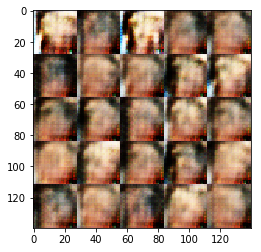


 Epoch 1/1 Step 8100 Discriminator Loss: 1.5173 ...  Generator Loss: 0.6289

 Epoch 1/1 Step 8110 Discriminator Loss: 1.6020 ...  Generator Loss: 0.6534

 Epoch 1/1 Step 8120 Discriminator Loss: 1.5420 ...  Generator Loss: 0.6844

 Epoch 1/1 Step 8130 Discriminator Loss: 1.5193 ...  Generator Loss: 0.6405

 Epoch 1/1 Step 8140 Discriminator Loss: 1.5008 ...  Generator Loss: 0.6964

 Epoch 1/1 Step 8150 Discriminator Loss: 1.4778 ...  Generator Loss: 0.7294

 Epoch 1/1 Step 8160 Discriminator Loss: 1.4236 ...  Generator Loss: 0.7263

 Epoch 1/1 Step 8170 Discriminator Loss: 1.4325 ...  Generator Loss: 0.6938

 Epoch 1/1 Step 8180 Discriminator Loss: 1.4604 ...  Generator Loss: 0.6739

 Epoch 1/1 Step 8190 Discriminator Loss: 1.4098 ...  Generator Loss: 0.7494


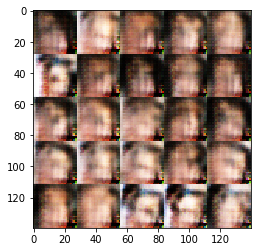


 Epoch 1/1 Step 8200 Discriminator Loss: 1.4045 ...  Generator Loss: 0.7406

 Epoch 1/1 Step 8210 Discriminator Loss: 1.5066 ...  Generator Loss: 0.7162

 Epoch 1/1 Step 8220 Discriminator Loss: 1.4743 ...  Generator Loss: 0.7788

 Epoch 1/1 Step 8230 Discriminator Loss: 1.4720 ...  Generator Loss: 0.6372

 Epoch 1/1 Step 8240 Discriminator Loss: 1.5141 ...  Generator Loss: 0.6444

 Epoch 1/1 Step 8250 Discriminator Loss: 1.4562 ...  Generator Loss: 0.7642

 Epoch 1/1 Step 8260 Discriminator Loss: 1.5210 ...  Generator Loss: 0.6796

 Epoch 1/1 Step 8270 Discriminator Loss: 1.4841 ...  Generator Loss: 0.6987

 Epoch 1/1 Step 8280 Discriminator Loss: 1.5212 ...  Generator Loss: 0.6490

 Epoch 1/1 Step 8290 Discriminator Loss: 1.5337 ...  Generator Loss: 0.6138


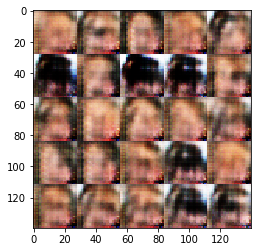


 Epoch 1/1 Step 8300 Discriminator Loss: 1.5571 ...  Generator Loss: 0.6625

 Epoch 1/1 Step 8310 Discriminator Loss: 1.5237 ...  Generator Loss: 0.6389

 Epoch 1/1 Step 8320 Discriminator Loss: 1.5354 ...  Generator Loss: 0.6674

 Epoch 1/1 Step 8330 Discriminator Loss: 1.4858 ...  Generator Loss: 0.7509

 Epoch 1/1 Step 8340 Discriminator Loss: 1.5606 ...  Generator Loss: 0.6568

 Epoch 1/1 Step 8350 Discriminator Loss: 1.5024 ...  Generator Loss: 0.6334

 Epoch 1/1 Step 8360 Discriminator Loss: 1.4464 ...  Generator Loss: 0.7346

 Epoch 1/1 Step 8370 Discriminator Loss: 1.5540 ...  Generator Loss: 0.5943

 Epoch 1/1 Step 8380 Discriminator Loss: 1.4631 ...  Generator Loss: 0.7236

 Epoch 1/1 Step 8390 Discriminator Loss: 1.5223 ...  Generator Loss: 0.7177


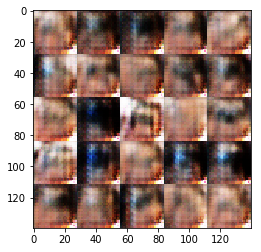


 Epoch 1/1 Step 8400 Discriminator Loss: 1.5300 ...  Generator Loss: 0.6569

 Epoch 1/1 Step 8410 Discriminator Loss: 1.5383 ...  Generator Loss: 0.6814

 Epoch 1/1 Step 8420 Discriminator Loss: 1.5096 ...  Generator Loss: 0.6561

 Epoch 1/1 Step 8430 Discriminator Loss: 1.5178 ...  Generator Loss: 0.7080

 Epoch 1/1 Step 8440 Discriminator Loss: 1.4746 ...  Generator Loss: 0.6575

 Epoch 1/1 Step 8450 Discriminator Loss: 1.5185 ...  Generator Loss: 0.6572

 Epoch 1/1 Step 8460 Discriminator Loss: 1.5599 ...  Generator Loss: 0.6690

 Epoch 1/1 Step 8470 Discriminator Loss: 1.5627 ...  Generator Loss: 0.6390

 Epoch 1/1 Step 8480 Discriminator Loss: 1.4972 ...  Generator Loss: 0.6459

 Epoch 1/1 Step 8490 Discriminator Loss: 1.5000 ...  Generator Loss: 0.7236


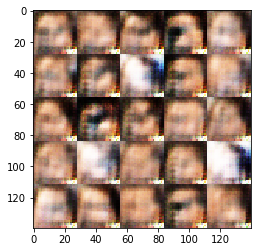


 Epoch 1/1 Step 8500 Discriminator Loss: 1.5670 ...  Generator Loss: 0.6878

 Epoch 1/1 Step 8510 Discriminator Loss: 1.4847 ...  Generator Loss: 0.6370

 Epoch 1/1 Step 8520 Discriminator Loss: 1.5574 ...  Generator Loss: 0.6067

 Epoch 1/1 Step 8530 Discriminator Loss: 1.5159 ...  Generator Loss: 0.6383

 Epoch 1/1 Step 8540 Discriminator Loss: 1.5850 ...  Generator Loss: 0.5835

 Epoch 1/1 Step 8550 Discriminator Loss: 1.4606 ...  Generator Loss: 0.7137

 Epoch 1/1 Step 8560 Discriminator Loss: 1.5682 ...  Generator Loss: 0.6678

 Epoch 1/1 Step 8570 Discriminator Loss: 1.5402 ...  Generator Loss: 0.6984

 Epoch 1/1 Step 8580 Discriminator Loss: 1.4904 ...  Generator Loss: 0.7390

 Epoch 1/1 Step 8590 Discriminator Loss: 1.4792 ...  Generator Loss: 0.7198


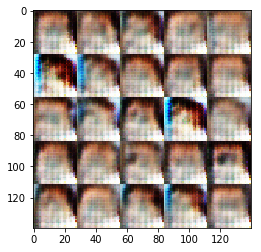


 Epoch 1/1 Step 8600 Discriminator Loss: 1.5306 ...  Generator Loss: 0.6535

 Epoch 1/1 Step 8610 Discriminator Loss: 1.4065 ...  Generator Loss: 0.7323

 Epoch 1/1 Step 8620 Discriminator Loss: 1.4567 ...  Generator Loss: 0.6880

 Epoch 1/1 Step 8630 Discriminator Loss: 1.5078 ...  Generator Loss: 0.6562

 Epoch 1/1 Step 8640 Discriminator Loss: 1.5063 ...  Generator Loss: 0.6312

 Epoch 1/1 Step 8650 Discriminator Loss: 1.4994 ...  Generator Loss: 0.6867

 Epoch 1/1 Step 8660 Discriminator Loss: 1.4613 ...  Generator Loss: 0.6545

 Epoch 1/1 Step 8670 Discriminator Loss: 1.5127 ...  Generator Loss: 0.6749

 Epoch 1/1 Step 8680 Discriminator Loss: 1.5357 ...  Generator Loss: 0.6999

 Epoch 1/1 Step 8690 Discriminator Loss: 1.4936 ...  Generator Loss: 0.6462


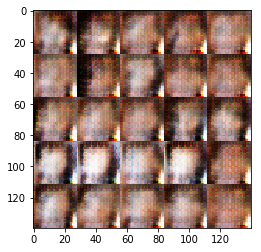


 Epoch 1/1 Step 8700 Discriminator Loss: 1.5016 ...  Generator Loss: 0.6579

 Epoch 1/1 Step 8710 Discriminator Loss: 1.4522 ...  Generator Loss: 0.7450

 Epoch 1/1 Step 8720 Discriminator Loss: 1.5308 ...  Generator Loss: 0.6909

 Epoch 1/1 Step 8730 Discriminator Loss: 1.5647 ...  Generator Loss: 0.6891

 Epoch 1/1 Step 8740 Discriminator Loss: 1.5021 ...  Generator Loss: 0.7634

 Epoch 1/1 Step 8750 Discriminator Loss: 1.5189 ...  Generator Loss: 0.7548

 Epoch 1/1 Step 8760 Discriminator Loss: 1.4061 ...  Generator Loss: 0.7361

 Epoch 1/1 Step 8770 Discriminator Loss: 1.4254 ...  Generator Loss: 0.6952

 Epoch 1/1 Step 8780 Discriminator Loss: 1.5228 ...  Generator Loss: 0.6749

 Epoch 1/1 Step 8790 Discriminator Loss: 1.4920 ...  Generator Loss: 0.6695


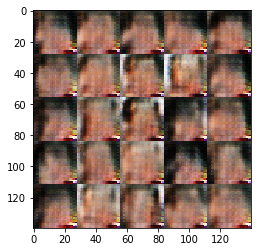


 Epoch 1/1 Step 8800 Discriminator Loss: 1.5235 ...  Generator Loss: 0.7150

 Epoch 1/1 Step 8810 Discriminator Loss: 1.5011 ...  Generator Loss: 0.6807

 Epoch 1/1 Step 8820 Discriminator Loss: 1.4845 ...  Generator Loss: 0.6927

 Epoch 1/1 Step 8830 Discriminator Loss: 1.4236 ...  Generator Loss: 0.7464

 Epoch 1/1 Step 8840 Discriminator Loss: 1.5031 ...  Generator Loss: 0.6326

 Epoch 1/1 Step 8850 Discriminator Loss: 1.5730 ...  Generator Loss: 0.7290

 Epoch 1/1 Step 8860 Discriminator Loss: 1.4415 ...  Generator Loss: 0.7951

 Epoch 1/1 Step 8870 Discriminator Loss: 1.4210 ...  Generator Loss: 0.7212

 Epoch 1/1 Step 8880 Discriminator Loss: 1.4213 ...  Generator Loss: 0.6980

 Epoch 1/1 Step 8890 Discriminator Loss: 1.4469 ...  Generator Loss: 0.6567


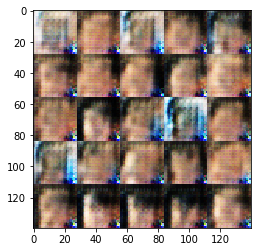


 Epoch 1/1 Step 8900 Discriminator Loss: 1.5428 ...  Generator Loss: 0.6993

 Epoch 1/1 Step 8910 Discriminator Loss: 1.5751 ...  Generator Loss: 0.6903

 Epoch 1/1 Step 8920 Discriminator Loss: 1.4600 ...  Generator Loss: 0.7038

 Epoch 1/1 Step 8930 Discriminator Loss: 1.4624 ...  Generator Loss: 0.6580

 Epoch 1/1 Step 8940 Discriminator Loss: 1.4540 ...  Generator Loss: 0.7287

 Epoch 1/1 Step 8950 Discriminator Loss: 1.4148 ...  Generator Loss: 0.7723

 Epoch 1/1 Step 8960 Discriminator Loss: 1.4624 ...  Generator Loss: 0.6972

 Epoch 1/1 Step 8970 Discriminator Loss: 1.5586 ...  Generator Loss: 0.6651

 Epoch 1/1 Step 8980 Discriminator Loss: 1.4945 ...  Generator Loss: 0.7194

 Epoch 1/1 Step 8990 Discriminator Loss: 1.4663 ...  Generator Loss: 0.6548


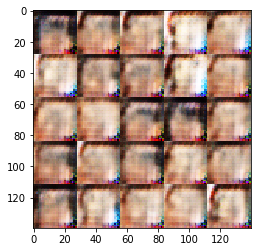


 Epoch 1/1 Step 9000 Discriminator Loss: 1.5129 ...  Generator Loss: 0.6852

 Epoch 1/1 Step 9010 Discriminator Loss: 1.4937 ...  Generator Loss: 0.6951

 Epoch 1/1 Step 9020 Discriminator Loss: 1.5773 ...  Generator Loss: 0.6071

 Epoch 1/1 Step 9030 Discriminator Loss: 1.5235 ...  Generator Loss: 0.7113

 Epoch 1/1 Step 9040 Discriminator Loss: 1.5253 ...  Generator Loss: 0.6431

 Epoch 1/1 Step 9050 Discriminator Loss: 1.5902 ...  Generator Loss: 0.5795

 Epoch 1/1 Step 9060 Discriminator Loss: 1.5671 ...  Generator Loss: 0.6287

 Epoch 1/1 Step 9070 Discriminator Loss: 1.4820 ...  Generator Loss: 0.6830

 Epoch 1/1 Step 9080 Discriminator Loss: 1.4619 ...  Generator Loss: 0.6726

 Epoch 1/1 Step 9090 Discriminator Loss: 1.5301 ...  Generator Loss: 0.6764


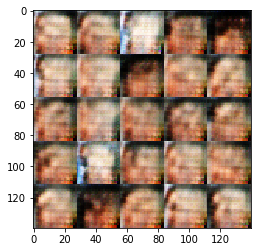


 Epoch 1/1 Step 9100 Discriminator Loss: 1.4646 ...  Generator Loss: 0.6972

 Epoch 1/1 Step 9110 Discriminator Loss: 1.4780 ...  Generator Loss: 0.7136

 Epoch 1/1 Step 9120 Discriminator Loss: 1.4165 ...  Generator Loss: 0.7498

 Epoch 1/1 Step 9130 Discriminator Loss: 1.5026 ...  Generator Loss: 0.7018

 Epoch 1/1 Step 9140 Discriminator Loss: 1.4736 ...  Generator Loss: 0.7055

 Epoch 1/1 Step 9150 Discriminator Loss: 1.4980 ...  Generator Loss: 0.6931

 Epoch 1/1 Step 9160 Discriminator Loss: 1.4613 ...  Generator Loss: 0.7326

 Epoch 1/1 Step 9170 Discriminator Loss: 1.5158 ...  Generator Loss: 0.6787

 Epoch 1/1 Step 9180 Discriminator Loss: 1.5544 ...  Generator Loss: 0.6782

 Epoch 1/1 Step 9190 Discriminator Loss: 1.4695 ...  Generator Loss: 0.6917


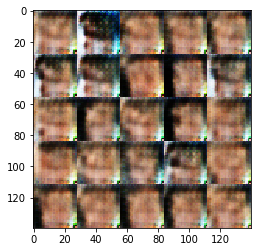


 Epoch 1/1 Step 9200 Discriminator Loss: 1.5046 ...  Generator Loss: 0.6807

 Epoch 1/1 Step 9210 Discriminator Loss: 1.4804 ...  Generator Loss: 0.7083

 Epoch 1/1 Step 9220 Discriminator Loss: 1.3947 ...  Generator Loss: 0.7393

 Epoch 1/1 Step 9230 Discriminator Loss: 1.5405 ...  Generator Loss: 0.6716

 Epoch 1/1 Step 9240 Discriminator Loss: 1.6007 ...  Generator Loss: 0.6894

 Epoch 1/1 Step 9250 Discriminator Loss: 1.5960 ...  Generator Loss: 0.6084

 Epoch 1/1 Step 9260 Discriminator Loss: 1.6094 ...  Generator Loss: 0.6071

 Epoch 1/1 Step 9270 Discriminator Loss: 1.5212 ...  Generator Loss: 0.6730

 Epoch 1/1 Step 9280 Discriminator Loss: 1.5575 ...  Generator Loss: 0.6309

 Epoch 1/1 Step 9290 Discriminator Loss: 1.4939 ...  Generator Loss: 0.7321


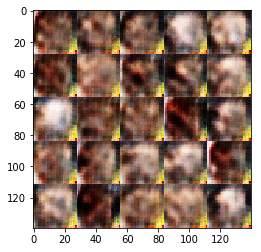


 Epoch 1/1 Step 9300 Discriminator Loss: 1.5482 ...  Generator Loss: 0.7081

 Epoch 1/1 Step 9310 Discriminator Loss: 1.5619 ...  Generator Loss: 0.6417

 Epoch 1/1 Step 9320 Discriminator Loss: 1.5332 ...  Generator Loss: 0.6080

 Epoch 1/1 Step 9330 Discriminator Loss: 1.5266 ...  Generator Loss: 0.6598

 Epoch 1/1 Step 9340 Discriminator Loss: 1.4950 ...  Generator Loss: 0.6869

 Epoch 1/1 Step 9350 Discriminator Loss: 1.4341 ...  Generator Loss: 0.7036

 Epoch 1/1 Step 9360 Discriminator Loss: 1.4701 ...  Generator Loss: 0.6551

 Epoch 1/1 Step 9370 Discriminator Loss: 1.5008 ...  Generator Loss: 0.7256

 Epoch 1/1 Step 9380 Discriminator Loss: 1.4917 ...  Generator Loss: 0.6316

 Epoch 1/1 Step 9390 Discriminator Loss: 1.4563 ...  Generator Loss: 0.7079


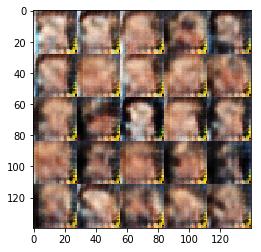


 Epoch 1/1 Step 9400 Discriminator Loss: 1.5066 ...  Generator Loss: 0.6798

 Epoch 1/1 Step 9410 Discriminator Loss: 1.5104 ...  Generator Loss: 0.6536

 Epoch 1/1 Step 9420 Discriminator Loss: 1.5691 ...  Generator Loss: 0.6793

 Epoch 1/1 Step 9430 Discriminator Loss: 1.4888 ...  Generator Loss: 0.7143

 Epoch 1/1 Step 9440 Discriminator Loss: 1.4728 ...  Generator Loss: 0.7050

 Epoch 1/1 Step 9450 Discriminator Loss: 1.5399 ...  Generator Loss: 0.6946

 Epoch 1/1 Step 9460 Discriminator Loss: 1.5520 ...  Generator Loss: 0.6737

 Epoch 1/1 Step 9470 Discriminator Loss: 1.5613 ...  Generator Loss: 0.6197

 Epoch 1/1 Step 9480 Discriminator Loss: 1.4824 ...  Generator Loss: 0.6945

 Epoch 1/1 Step 9490 Discriminator Loss: 1.4729 ...  Generator Loss: 0.7226


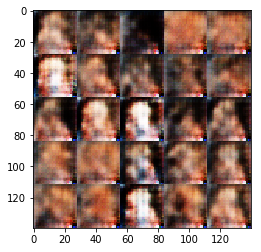


 Epoch 1/1 Step 9500 Discriminator Loss: 1.5123 ...  Generator Loss: 0.6648

 Epoch 1/1 Step 9510 Discriminator Loss: 1.4727 ...  Generator Loss: 0.6531

 Epoch 1/1 Step 9520 Discriminator Loss: 1.4872 ...  Generator Loss: 0.7107

 Epoch 1/1 Step 9530 Discriminator Loss: 1.4606 ...  Generator Loss: 0.7027


KeyboardInterrupt: 

In [15]:
batch_size = 16
z_dim = 128
learning_rate = .0002
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.